Pontificia Universidad Católica de Chile <br>
Departamento de Ciencia de la Computación <br>
IIC3641 - Aprendizaje Automático Basado en Grafos <br>
Segundo Semestre 2025<br>


<h1><center> Tarea 1: Modelos de grafos  </center></h1>
        Profesor: Marcelo Mendoza<br>
        Fecha de entrega: 8 de septiembre

---

## Indicaciones

Se debe entregar **SOLO** el archivo .ipynb en el buzón respectivo en canvas.

**IMPORTANTE**:
- Se asignará puntaje por el código implementado y los comentarios asociados a resultados.
- El notebook debe tener todas las celdas de código ejecutadas.
- Cualquier instancia de copia resultará en un 1,1 como nota de curso.
- Esta tarea **NO** requiere el uso de GPU.

---

# Integrantes del grupo

* Estudiante 1: Itzae Flores
* Estudiante 2: Matías Vidal

# Librerías

In [ ]:
%pip install networkx

Note: you may need to restart the kernel to use updated packages.


In [ ]:
# Importa aquí las librerías que vayas a utilizar
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import networkx as nx

# Parte 1: Análisis red de colaboración (20 puntos)

En esta sección se debe desarrollar un análisis descriptivo con las principales características asociadas a las siguietes redes:
* **General Relativity and Quantum Cosmology collaboration network:** ca-GrQc.txt
* **Erdös Number:** Erdos982.txt

Suponga que las redes son no dirigidas.

In [ ]:
df_asia = pd.read_csv("lastfm_asia_edges.csv")
df_asia.head()

,node_1,node_2
0,0,747
1,1,4257
2,1,2194
3,1,580
4,1,6478


## 1.1 Medidas básicas (10 puntos)


Grafique las redes de colaboraciones y determine las siguientes medidas descriptivas para cada caso si se puede:

* Número de nodos
* Número de componentes
* Número de aristas
* Grado promedio
* Diametro
* Camino mínimo promedio

¿Qué características diferencian a estas redes? Interprete sus resultados en el contexto del problema.

**Observación**

En caso de reconocer dos o más componentes asociados a una red, solo trabaje con la de mayor tamaño .


**Respuesta:**

Para el General Relativity and Quantum Cosmology Network: "ca-GrQc"

In [ ]:
fh = open("ca-GrQc.txt", "rb") # Es el General Relativity and Quantum Cosmology Network
G = nx.read_edgelist(fh)
fh.close()
#cantidad de nodos y edges
print(G)
#cantidad de componentes
num_components = nx.number_connected_components(G)
print("Número de componentes conexas:", num_components)


Graph with 5244 nodes and 14497 edges
Número de componentes conexas: 356


/home/mati/Projects/venv/lib/python3.12/site-packages/networkx/drawing/nx_pylab.py:1438: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


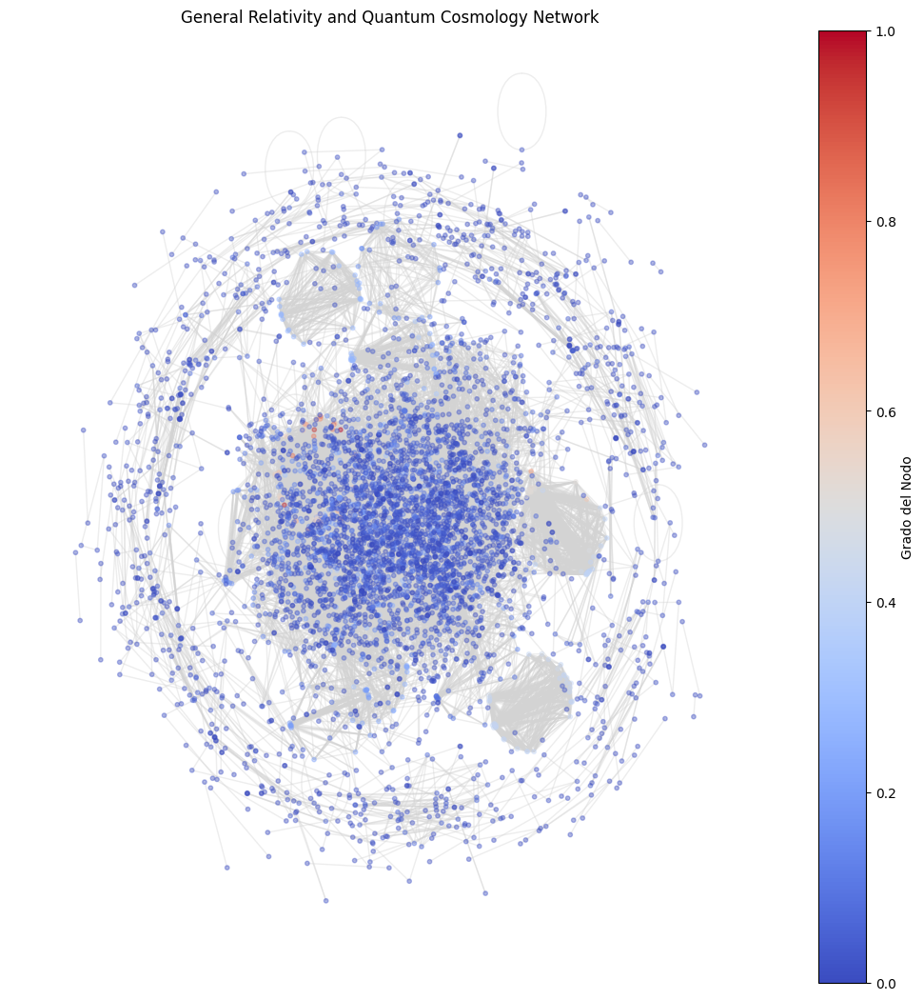

In [74]:
node_degrees = dict(G.degree())
degrees = np.array(list(node_degrees.values()))
min_degree = degrees.min()
max_degree = degrees.max()
normalized_degrees = (degrees - min_degree) / (max_degree - min_degree)
colors = plt.cm.coolwarm(normalized_degrees)
pos = nx.forceatlas2_layout(G)  # Posiciones de los nodos
plt.figure(figsize=(10, 10))
nx.draw(G, pos, node_color=colors, with_labels=False, node_size=10, cmap=plt.cm.coolwarm, edge_color='lightgray', font_size=4, alpha=0.4)
plt.title("General Relativity and Quantum Cosmology Network")
plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.coolwarm), ax=plt.gca(), label="Grado del Nodo")
plt.show()

In [75]:
# Información básica del grafo
num_nodos = G.number_of_nodes()  # Número de nodos
num_aristas = G.number_of_edges()  # Número de aristas
grados_nodos = dict(G.degree())  # Grado de cada nodo
grado_promedio = sum(grados_nodos.values()) / num_nodos  # Grado promedio
denso = nx.density(G)  # Densidad del grafo
componentes_conectados = nx.number_connected_components(G)  # Número de componentes conectados
#camino_minimo_promedio = dict(nx.average_shortest_path_length(G))  # Camino minimo promedio

# Información sobre la estructura del grafo
es_conexo = nx.is_connected(G)  # Verificar si el grafo es conexo
diámetro = nx.diameter(G) if es_conexo else 'N/A'  # Diámetro del grafo si es conexo
longitud_media_caminos = nx.average_shortest_path_length(G) if es_conexo else 'N/A'  # Longitud media de los caminos más cortos si es conexo
coef_clustering = nx.average_clustering(G)  # Coeficiente de agrupamiento promedio

# Mostrar la información
print(f"Número de nodos: {num_nodos}")
print(f"Número de aristas: {num_aristas}")
print(f"Componentes conectados: {componentes_conectados}")
print(f"Es conexo: {es_conexo}")
print(f"Diámetro del grafo: {diámetro}")
# Grado promedio
print("Grado promedio:", grado_promedio)



Número de nodos: 5244
Número de aristas: 14497
Componentes conectados: 356
Es conexo: False
Diámetro del grafo: N/A
Grado promedio: 5.528985507246377


Red Erdos

In [ ]:
fh = open("Erdos982.txt", "rb")
G_erdos = nx.read_edgelist(fh)
fh.close()

#cantidad de nodos y edges
print(G_erdos)

#cantidad de componentes

num_components = nx.number_connected_components(G_erdos)
print("Número de componentes conexas:", num_components)

Graph with 4964 nodes and 7376 edges
Número de componentes conexas: 18


/home/mati/Projects/venv/lib/python3.12/site-packages/networkx/drawing/nx_pylab.py:1438: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


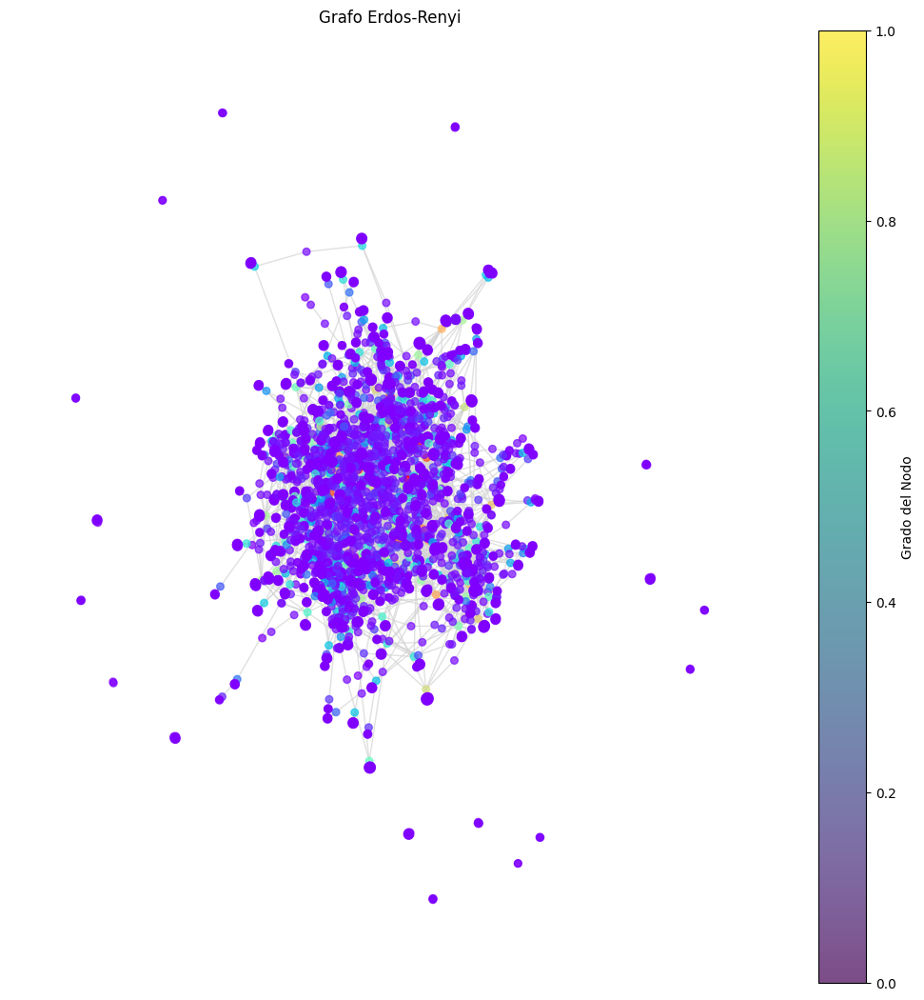

In [76]:
node_degrees = dict(G_erdos.degree())
degrees = np.array(list(node_degrees.values()))
min_degree = degrees.min()
max_degree = degrees.max()

normalized_degrees = (degrees - min_degree) / (max_degree - min_degree)

colors = plt.cm.rainbow(normalized_degrees)

pos = nx.forceatlas2_layout(G_erdos)  # Posiciones de los nodos

plt.figure(figsize=(10, 10))
nx.draw(G_erdos, pos, node_color=colors, with_labels=False, node_size=30, cmap=plt.cm.rainbow, edge_color='lightgray', font_size=4, alpha=0.7)
plt.title("Grafo Erdos-Renyi")
plt.colorbar(plt.gca().collections[0], label="Grado del Nodo")
plt.show()

In [77]:
# Información básica del grafo
num_nodos = G_erdos.number_of_nodes()  # Número de nodos
num_aristas = G_erdos.number_of_edges()  # Número de aristas
grados_nodos = dict(G_erdos.degree())  # Grado de cada nodo
grado_promedio = sum(grados_nodos.values()) / num_nodos  # Grado promedio
denso = nx.density(G_erdos)  # Densidad del grafo
componentes_conectados = nx.number_connected_components(G_erdos)  # Número de componentes conectados
#camino_minimo_promedio = dict(nx.average_shortest_path_length(G_erdos))  # Camino minimo promedio

# Información sobre la estructura del grafo
es_conexo = nx.is_connected(G_erdos)  # Verificar si el grafo es conexo
diámetro = nx.diameter(G_erdos) if es_conexo else 'N/A'  # Diámetro del grafo si es conexo
longitud_media_caminos = nx.average_shortest_path_length(G_erdos) if es_conexo else 'N/A'  # Longitud media de los caminos más cortos si es conexo
coef_clustering = nx.average_clustering(G_erdos)  # Coeficiente de agrupamiento promedio

# Mostrar la información
print(f"Número de nodos: {num_nodos}")
print(f"Número de aristas: {num_aristas}")
print(f"Componentes conectados: {componentes_conectados}")
print(f"Es conexo: {es_conexo}")
print(f"Diámetro del grafo: {diámetro}")
#grado promedio
print("Grado promedio:", grado_promedio)
print("No se puede calcular el camino mínimo promedio con la función, porque no es conexo") # U SURE??? EXPLICAR PORQUE


Número de nodos: 4964
Número de aristas: 7376
Componentes conectados: 18
Es conexo: False
Diámetro del grafo: N/A
Grado promedio: 2.9717969379532634
No se puede calcular el camino mínimo promedio con la función, porque no es conexo


## 1.2 Evaluación de nodos (5 puntos)

Investigue y describa las siguientes métricas:

* degree centrality: mide la proporción de links directos que un nodo individual tiene con otros nodos en la red, respecto a la cantidad total de nodos en la red. La fórmula calcula el numero de links directos del nodo N, divido en el número máximo de conexiones posibles (n-1), siendo n la cantidad de nodos.

* closeness centrality: mide qué tan cerca se encuentra un nodo de todos los demás nodos en la red, considerando la suma de las distancias mínimas a cada uno. Se interpreta como la capacidad de un nodo para llegar rápidamente al resto. La fórmula calcula el número de nodos alcanzables (n-1) dividido por la suma de las distancias más cortas desde el nodo  N hacia todos los demás.

* betweenness centrality: mide la proporción de veces que un nodo actúa como “puente” o intermediario en los caminos más cortos entre otros pares de nodos. Refleja la importancia de un nodo en el control del flujo de información dentro de la red. La fórmula cuenta el número de caminos más cortos entre dos nodos que pasan por el nodo v, dividido por el número total de caminos más cortos entre esos dos nodos:

¿En qué se diferencian?

Degree centrality mide la cantidad de conexiones directas de un nodo y su popularidad local. Closeness centrality mide la eficiencia con la que un nodo puede alcanzar a todos los demás a través de caminos cortos. Betweenness centrality mide el grado en que un nodo actúa como intermediario en los caminos más cortos y refleja su influencia en el flujo de información en la red.

Calcule las métricas para cada red y grafique su distribución. Comente.

Para cada caso, ¿qué nodos son los más relevantes según el criterio de centralidad?

**Respuesta:**

In [ ]:
#red ca

#degree centrality
degree_centrality = nx.degree_centrality(G)
print("Degree Centrality:", degree_centrality)
#closeness centrality
closeness_centrality = nx.closeness_centrality(G)
print("Closeness Centrality:", closeness_centrality)
#betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G)
print("Betweenness Centrality:", betweenness_centrality)

Degree Centrality: {'FromNodeId': 0.00019073049780659929, 'ToNodeId': 0.00019073049780659929, '3466': 0.0015258439824527943, '937': 0.0009536524890329964, '5233': 0.00038146099561319857, '8579': 0.0009536524890329964, '10310': 0.002479496471485791, '15931': 0.0019073049780659929, '17038': 0.003242418462712188, '18720': 0.0005721914934197979, '19607': 0.0007629219912263971, '1854': 0.0015258439824527943, '4583': 0.0005721914934197979, '9572': 0.006484836925424376, '10841': 0.0013351134846461949, '13056': 0.0019073049780659929, '14982': 0.00038146099561319857, '16310': 0.003242418462712188, '19640': 0.004768262445164982, '23855': 0.0015258439824527943, '24372': 0.00019073049780659929, '24814': 0.004005340453938585, '5052': 0.005531184436391379, '899': 0.0005721914934197979, '1796': 0.00038146099561319857, '2287': 0.0026702269692923898, '3096': 0.0022887659736791914, '3386': 0.002098035475872592, '4472': 0.0007629219912263971, '5346': 0.0038146099561319857, '5740': 0.00019073049780659929,


=== Degree Centrality para red ca-GrQc===
Valor máximo: 0.0154
Valor mínimo: 0.0002
Promedio: 0.0011
Desviación estándar: 0.0015
Top 3 nodos:
  1. Nodo 21012: 0.0154
  2. Nodo 21281: 0.0151
  3. Nodo 22691: 0.0147


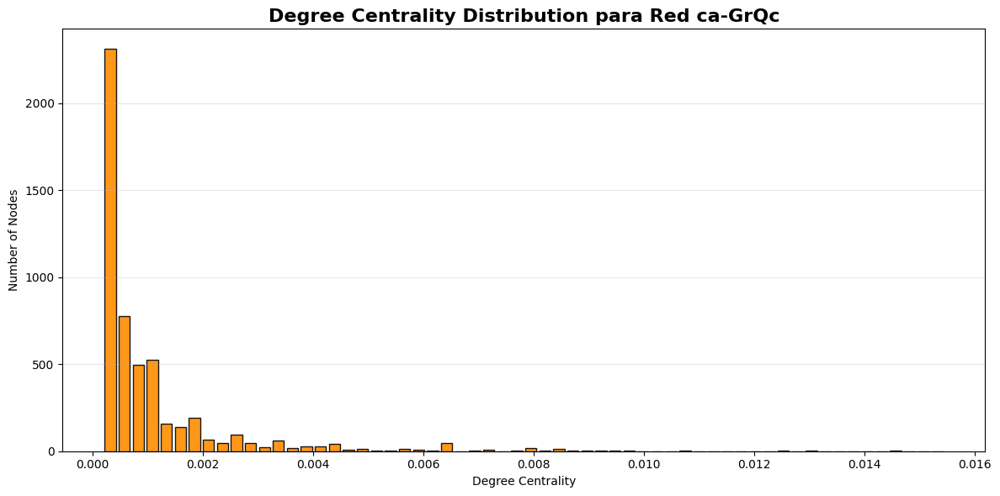


=== Closeness Centrality para red ca-GrQc===
Valor máximo: 0.1942
Valor mínimo: 0.0000
Promedio: 0.1062
Desviación estándar: 0.0566
Top 3 nodos:
  1. Nodo 13801: 0.1942
  2. Nodo 14485: 0.1895
  3. Nodo 9572: 0.1890


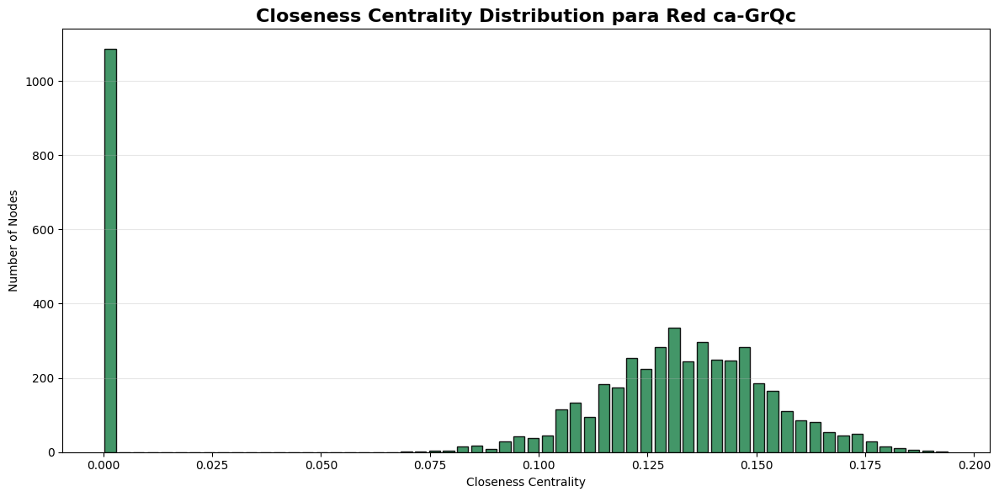


=== Betweenness Centrality para red ca-GrQc===
Valor máximo: 0.0370
Valor mínimo: 0.0000
Promedio: 0.0006
Desviación estándar: 0.0020
Top 3 nodos:
  1. Nodo 13801: 0.0370
  2. Nodo 9572: 0.0257
  3. Nodo 14599: 0.0255


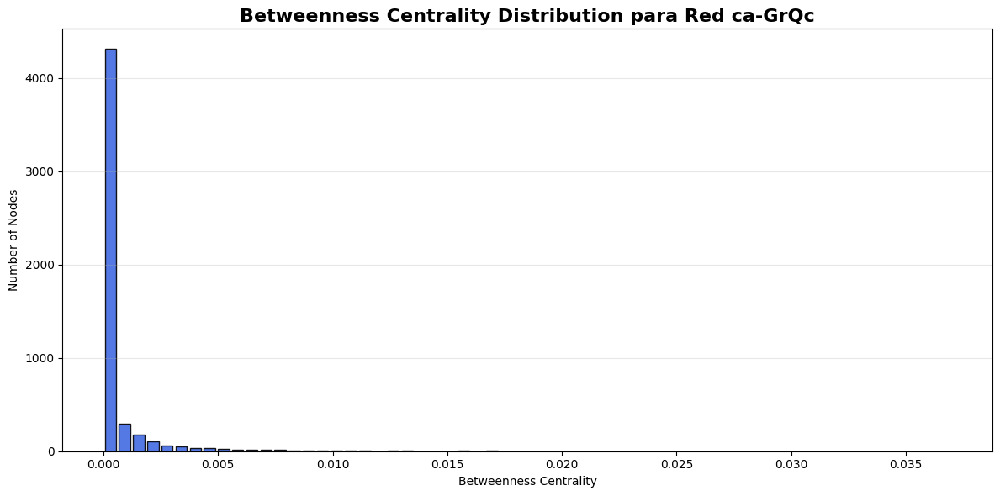

In [ ]:
#GRÁFICO PARA DEGREE CENTRALITY

def plot_centrality(centrality_type, bins=60, type='Degree', net_name="ca-GrQc"):
    values = list(centrality_type.values())
    
    colordict = {'Degree': 'darkorange',
                'Closeness': 'seagreen',
                'Betweenness': 'royalblue'}

    plt.figure(figsize=(12, 6))
    plt.hist(values, bins=bins, alpha=0.9, edgecolor='black', rwidth=0.8, color=colordict.get(type, 'darkorange'))
    plt.title(f'{type} Centrality Distribution para Red {net_name}', fontsize=16, fontweight='bold')
    plt.xlabel(f'{type} Centrality')
    plt.ylabel('Number of Nodes')
    plt.grid(axis='y', alpha=0.3, which='both')
    plt.tight_layout()
    plt.show()

# FUNCIÓN PARA MOSTRAR ESTADÍSTICAS DE CADA MÉTRICA
def print_centrality_stats(centrality_dict, metric_name, net_name="ca-GrQc"):
    values = list(centrality_dict.values())
    sorted_items = sorted(centrality_dict.items(), key=lambda x: x[1], reverse=True)
    
    print(f"\n=== {metric_name} para red {net_name}===")
    print(f"Valor máximo: {max(values):.4f}")
    print(f"Valor mínimo: {min(values):.4f}")
    print(f"Promedio: {np.mean(values):.4f}")
    print(f"Desviación estándar: {np.std(values):.4f}")
    print(f"Top 3 nodos:")
    for i, (node, value) in enumerate(sorted_items[:3]):
        print(f"  {i+1}. Nodo {node}: {value:.4f}")

for i in [("Degree Centrality", degree_centrality), 
          ("Closeness Centrality", closeness_centrality), 
          ("Betweenness Centrality", betweenness_centrality)]:
    metric_name, centrality_dict = i
    print_centrality_stats(centrality_dict, metric_name)
    
    # Crear gráficos
    plot_centrality(centrality_dict, type=metric_name.split()[0], net_name="ca-GrQc")

In [12]:
#red erdos

#degree centrality
degree_centrality_erdos = nx.degree_centrality(G_erdos)
print("Degree Centrality:", degree_centrality)
#closeness centrality
closeness_centrality_erdos = nx.closeness_centrality(G_erdos)
print("Closeness Centrality:", closeness_centrality)
#betweenness centrality
betweenness_centrality_erdos = nx.betweenness_centrality(G_erdos)
print("Betweenness Centrality:", betweenness_centrality)

Degree Centrality: {'FromNodeId': 0.00019073049780659929, 'ToNodeId': 0.00019073049780659929, '3466': 0.0015258439824527943, '937': 0.0009536524890329964, '5233': 0.00038146099561319857, '8579': 0.0009536524890329964, '10310': 0.002479496471485791, '15931': 0.0019073049780659929, '17038': 0.003242418462712188, '18720': 0.0005721914934197979, '19607': 0.0007629219912263971, '1854': 0.0015258439824527943, '4583': 0.0005721914934197979, '9572': 0.006484836925424376, '10841': 0.0013351134846461949, '13056': 0.0019073049780659929, '14982': 0.00038146099561319857, '16310': 0.003242418462712188, '19640': 0.004768262445164982, '23855': 0.0015258439824527943, '24372': 0.00019073049780659929, '24814': 0.004005340453938585, '5052': 0.005531184436391379, '899': 0.0005721914934197979, '1796': 0.00038146099561319857, '2287': 0.0026702269692923898, '3096': 0.0022887659736791914, '3386': 0.002098035475872592, '4472': 0.0007629219912263971, '5346': 0.0038146099561319857, '5740': 0.00019073049780659929,


=== Degree Centrality para red Erdos-Renyi===
Valor máximo: 0.0123
Valor mínimo: 0.0002
Promedio: 0.0006
Desviación estándar: 0.0013
Top 3 nodos:
  1. Nodo 426: 0.0123
  2. Nodo 438: 0.0121
  3. Nodo 244: 0.0117


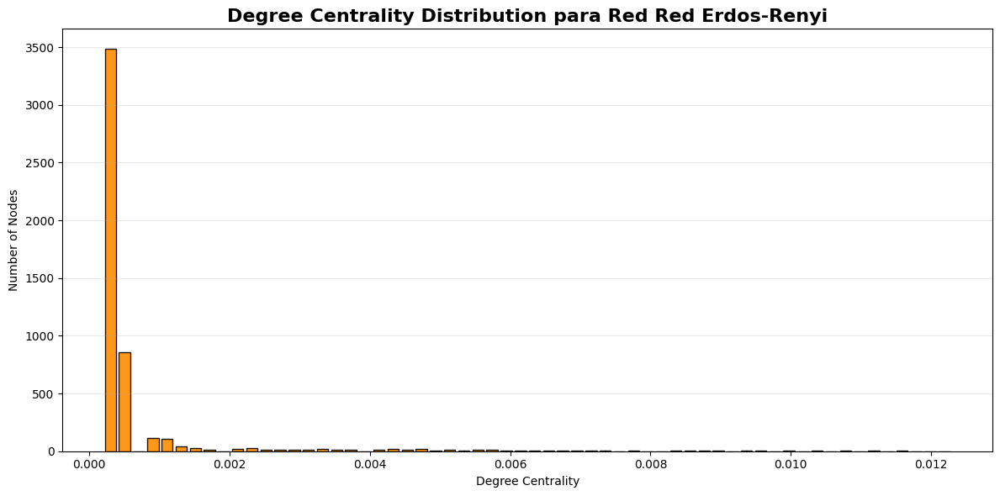


=== Closeness Centrality para red Erdos-Renyi===
Valor máximo: 0.2722
Valor mínimo: 0.0002
Promedio: 0.1788
Desviación estándar: 0.0318
Top 3 nodos:
  1. Nodo 417: 0.2722
  2. Nodo 415: 0.2709
  3. Nodo 438: 0.2673


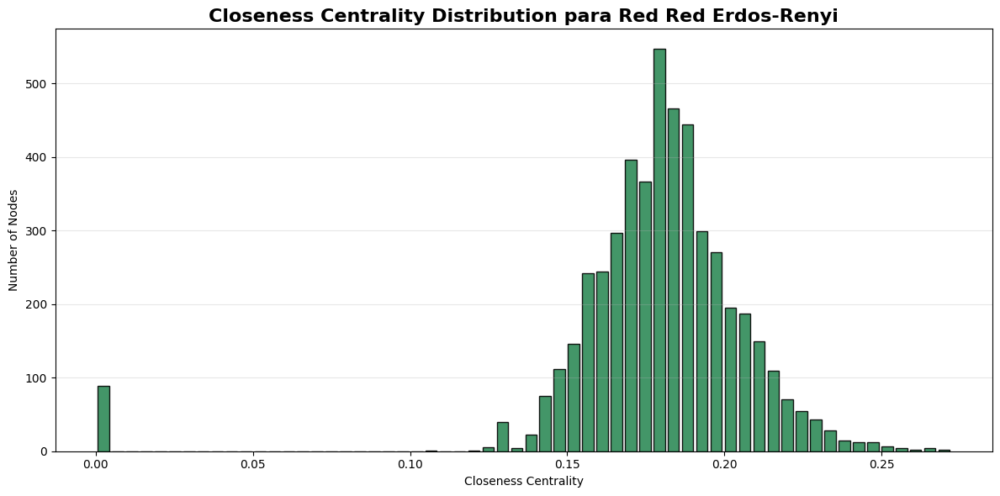


=== Betweenness Centrality para red Erdos-Renyi===
Valor máximo: 0.0598
Valor mínimo: 0.0000
Promedio: 0.0009
Desviación estándar: 0.0036
Top 3 nodos:
  1. Nodo 175: 0.0598
  2. Nodo 417: 0.0573
  3. Nodo 415: 0.0569


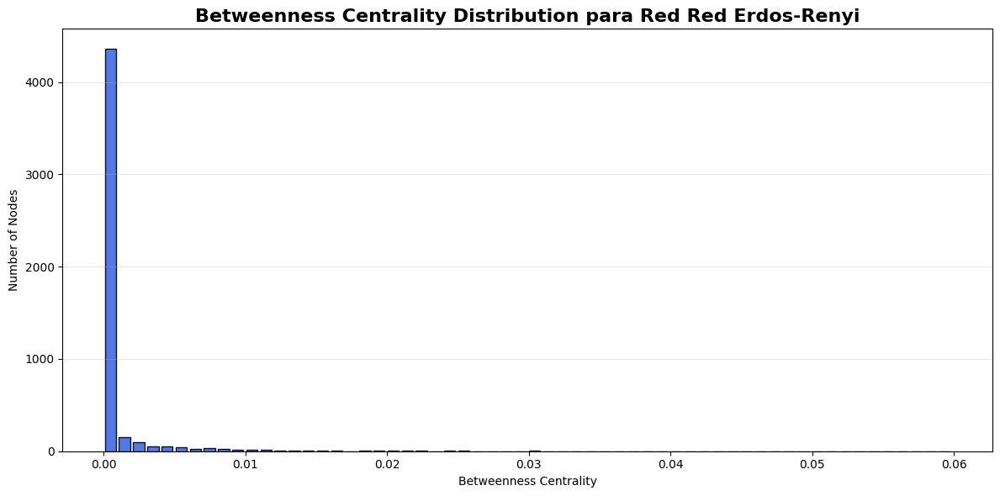

In [47]:
for i in [("Degree Centrality", degree_centrality_erdos), 
          ("Closeness Centrality", closeness_centrality_erdos), 
          ("Betweenness Centrality", betweenness_centrality_erdos)]:
    metric_name, centrality_dict = i
    print_centrality_stats(centrality_dict, metric_name, net_name='Erdos-Renyi')
    
    # Crear gráficos
    plot_centrality(centrality_dict, type=metric_name.split()[0], net_name="Red Erdos-Renyi")
 


Aquí se puede ver claramente que la red ca-GrCq tiene muchos nodos más sin centralidad en general, mientras la erdos renyi si, esto puede ser explicado por que la primera es real y se asemeja a una scale-free, la segunda es homogénea (por ende no sigue tan bien la ley de potencias). Siempre va a haber menos nodos conectados en una red real que en una aleatoria.

## 1.3 Eliminación de nodos (5 puntos)

Tomando en consideración el criterio de centralidad de los nodos, elimine los 10 más relevantes para cada caso. Justifique su decisión.

Luego, grafique las nuevas redes obtenidas y calcule las métricas de la actividad 1.1. Comente.

¿Qué red muestra mayor robustez? Justifique su respuesta.

**Respuesta:**

Nuevas metricas

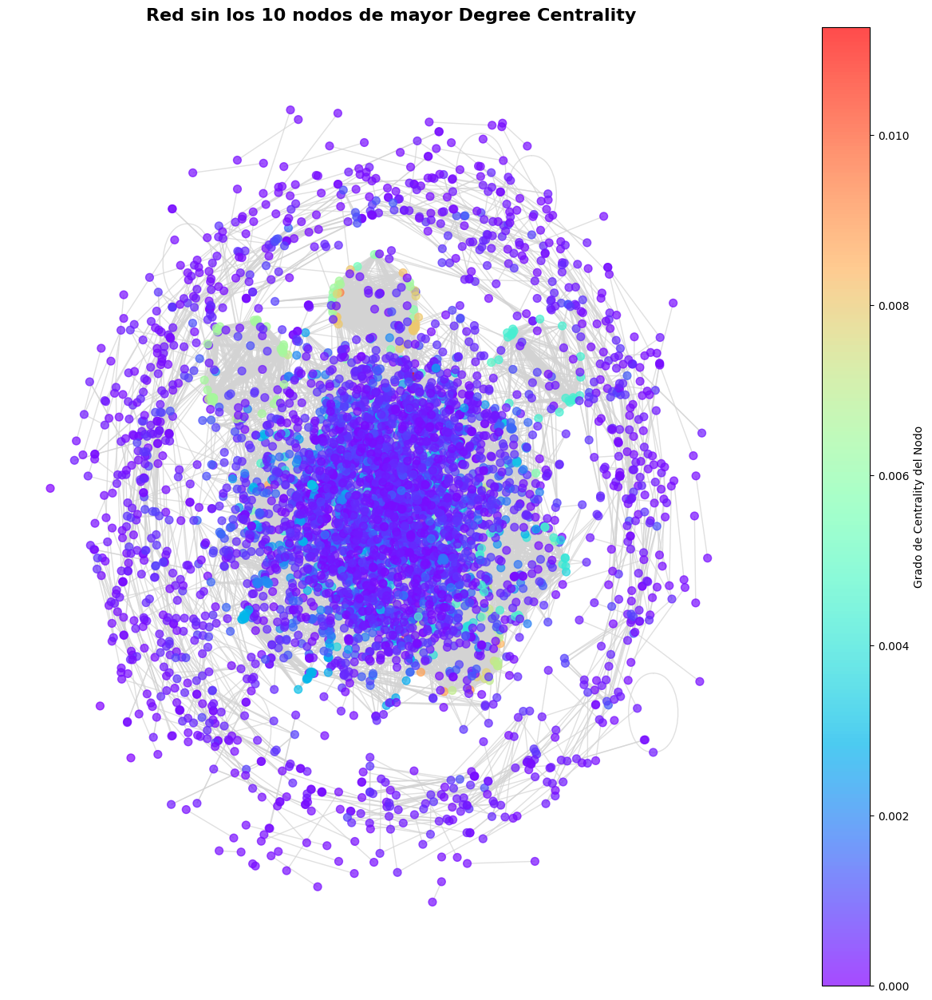

In [79]:
G_not_degree = G.copy()
G_not_degree.remove_nodes_from(sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:10])

# Graficar con colores basados en degree centrality
plt.figure(figsize=(12, 12))
pos = nx.forceatlas2_layout(G_not_degree)
new_degree_centrality = nx.degree_centrality(G_not_degree)
node_colors = [new_degree_centrality[node] for node in G_not_degree.nodes()]
nx.draw(G_not_degree, pos, with_labels=False, node_size=50, node_color=node_colors, cmap=plt.cm.rainbow, alpha=0.7, edge_color='lightgray')
plt.colorbar(plt.gca().collections[0], label="Grado de Centrality del Nodo")
plt.title('Red sin los 10 nodos de mayor Degree Centrality', fontsize=16, fontweight='bold')
plt.show()



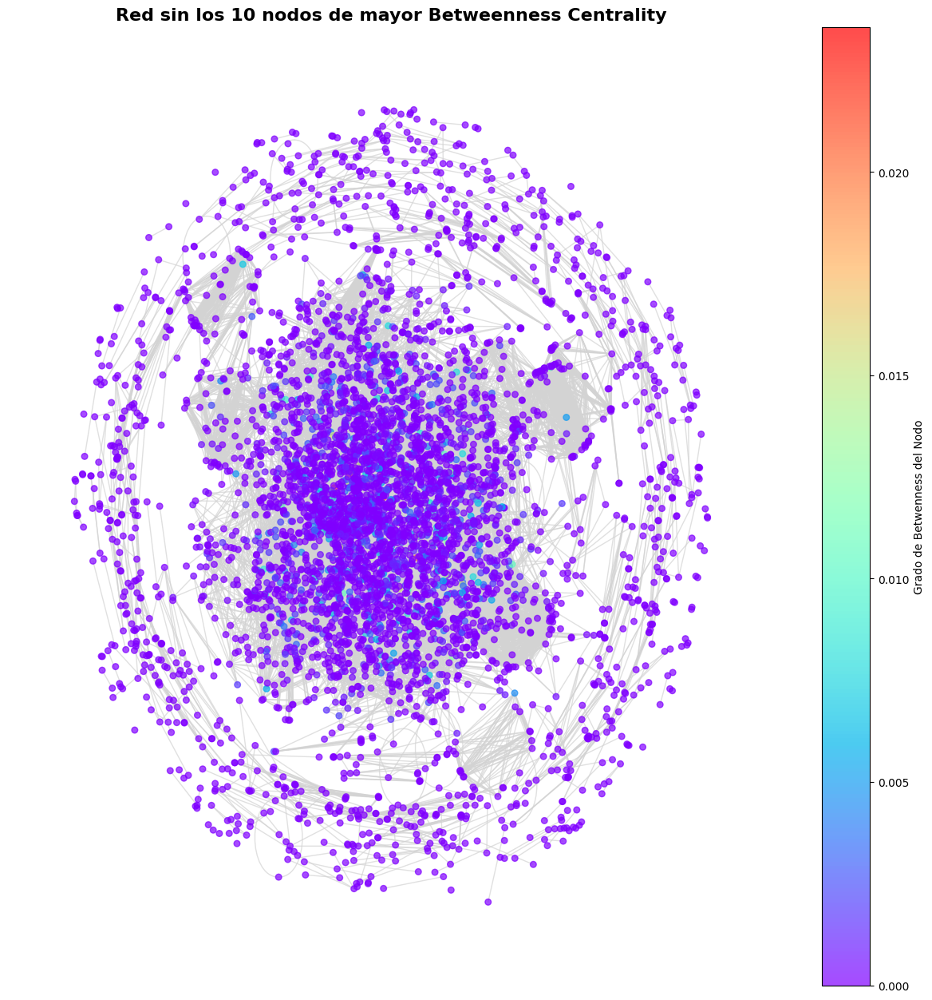

In [81]:
G_not_betweenness = G.copy()
G_not_betweenness.remove_nodes_from(sorted(betweenness_centrality, key=betweenness_centrality.get, reverse=True)[:10])
# Graficar con colores basados en betweenness centrality

plt.figure(figsize=(12, 12))
pos = nx.forceatlas2_layout(G_not_betweenness)
new_betwenness_centrality = nx.betweenness_centrality(G_not_betweenness)
node_colors = [new_betwenness_centrality[node] for node in G_not_betweenness.nodes()]
nx.draw(G_not_betweenness, pos, with_labels=False, node_size=30, node_color=node_colors, cmap=plt.cm.rainbow, alpha=0.7, edge_color='lightgray')
plt.colorbar(plt.gca().collections[0], label="Grado de Betwenness del Nodo")
plt.title('Red sin los 10 nodos de mayor Betweenness Centrality', fontsize=16, fontweight='bold')
plt.show()

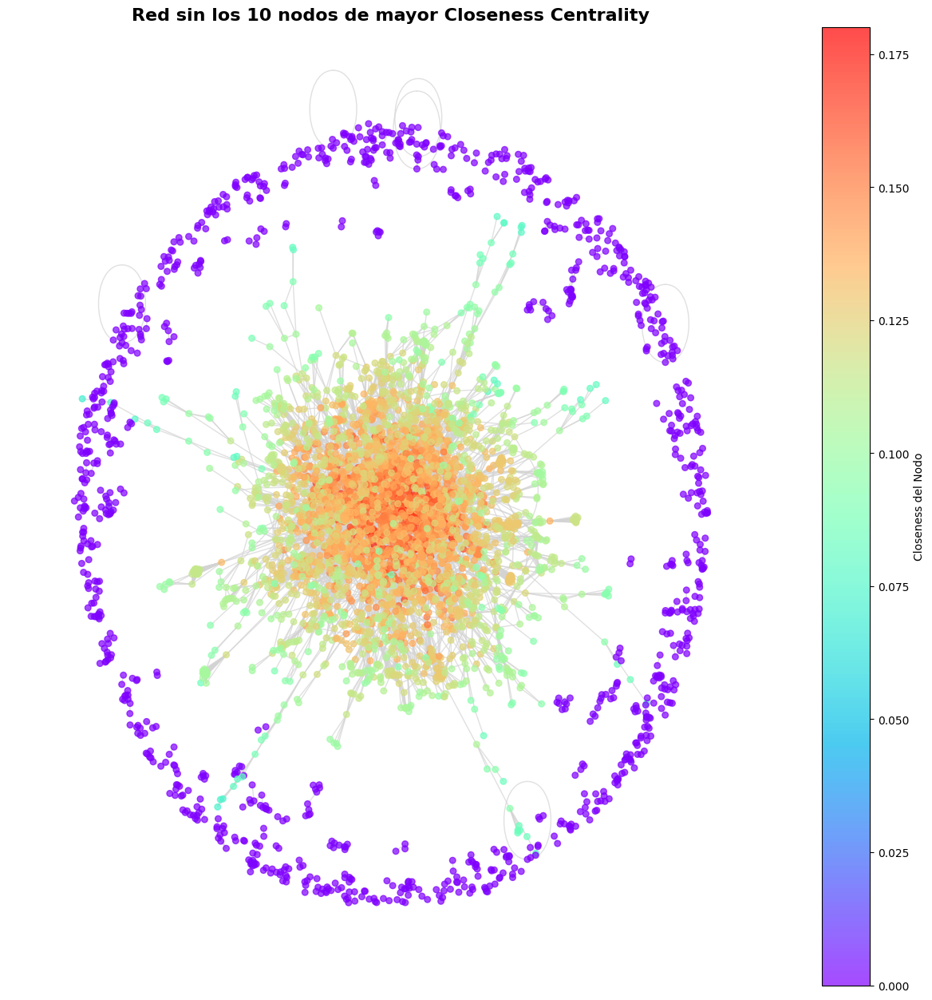

In [84]:
G_not_closeness = G.copy()
G_not_closeness.remove_nodes_from(sorted(closeness_centrality, key=closeness_centrality.get, reverse=True)[:10])
# Graficar con colores basados en closeness centrality
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G_not_closeness)
new_closeness_centrality = nx.closeness_centrality(G_not_closeness)
node_colors = [new_closeness_centrality[node] for node in G_not_closeness.nodes()]
nx.draw(G_not_closeness, pos, with_labels=False, node_size=30, node_color=node_colors, cmap=plt.cm.rainbow, alpha=0.7, edge_color='lightgray')
plt.colorbar(plt.gca().collections[0], label="Closeness del Nodo")
plt.title('Red sin los 10 nodos de mayor Closeness Centrality', fontsize=16, fontweight='bold')
plt.show()

In [85]:
# Calcular nuevas métricas promedio
new_degree_centrality = nx.degree_centrality(G_not_degree)
new_closeness_centrality = nx.closeness_centrality(G_not_closeness)
new_betweenness_centrality = nx.betweenness_centrality(G_not_betweenness)
print("Nuevas métricas después de remover nodos con mayor Degree Centrality:")
print("Degree Centrality:", new_degree_centrality)
print("Closeness Centrality:", new_closeness_centrality)
print("Betweenness Centrality:", new_betweenness_centrality)


Nuevas métricas después de remover nodos con mayor Degree Centrality:
Degree Centrality: {'FromNodeId': 0.00019109497420217848, 'ToNodeId': 0.00019109497420217848, '3466': 0.0015287597936174278, '937': 0.0009554748710108924, '5233': 0.00038218994840435696, '8579': 0.0009554748710108924, '10310': 0.0024842346646283204, '15931': 0.0019109497420217848, '17038': 0.003248614561437034, '18720': 0.0005732849226065354, '19607': 0.0007643798968087139, '1854': 0.0015287597936174278, '4583': 0.0005732849226065354, '9572': 0.006497229122874068, '10841': 0.0013376648194152493, '13056': 0.0019109497420217848, '14982': 0.00038218994840435696, '16310': 0.003248614561437034, '19640': 0.004395184406650105, '23855': 0.0015287597936174278, '24372': 0.00019109497420217848, '24814': 0.004012994458245748, '5052': 0.005541754251863176, '899': 0.0005732849226065354, '1796': 0.00038218994840435696, '2287': 0.0026753296388304986, '3096': 0.0022931396904261416, '3386': 0.0021020447162239633, '4472': 0.00076437989


=== Degree Centrality para red ca-GrQc [Sin Top 10 Nodos]===
Valor máximo: 0.0113
Valor mínimo: 0.0000
Promedio: 0.0010
Desviación estándar: 0.0013
Top 3 nodos:
  1. Nodo 15244: 0.0113
  2. Nodo 15003: 0.0099
  3. Nodo 14807: 0.0096


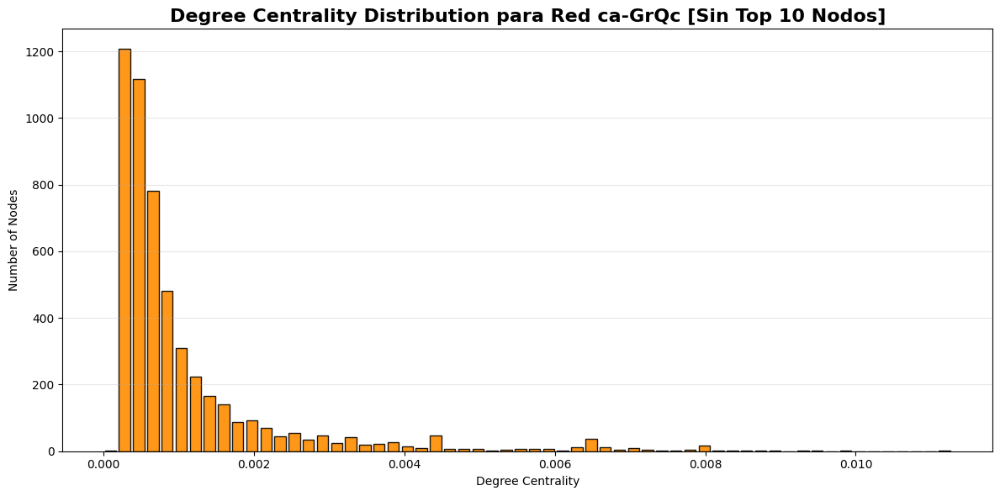


=== Closeness Centrality para red ca-GrQc [Sin Top 10 Nodos]===
Valor máximo: 0.1802
Valor mínimo: 0.0000
Promedio: 0.1022
Desviación estándar: 0.0550
Top 3 nodos:
  1. Nodo 5052: 0.1802
  2. Nodo 16148: 0.1777
  3. Nodo 13096: 0.1775


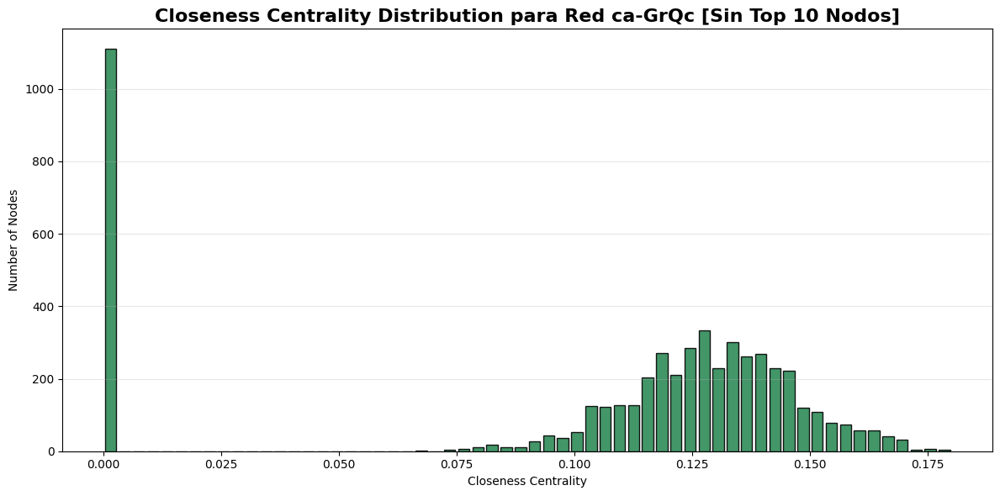


=== Betweenness Centrality para red ca-GrQc [Sin Top 10 Nodos]===
Valor máximo: 0.0236
Valor mínimo: 0.0000
Promedio: 0.0006
Desviación estándar: 0.0019
Top 3 nodos:
  1. Nodo 2654: 0.0236
  2. Nodo 10762: 0.0220
  3. Nodo 19865: 0.0204


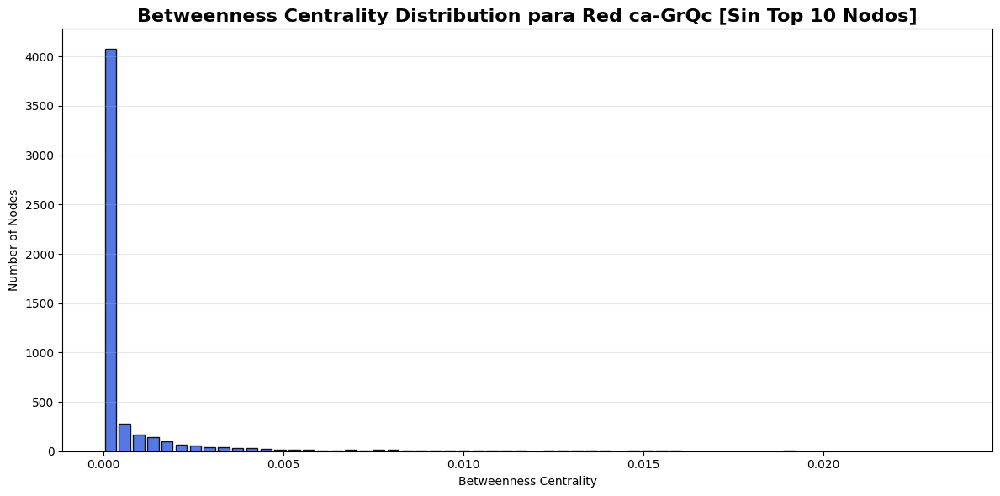

In [87]:
for i in [("Degree Centrality", new_degree_centrality), 
          ("Closeness Centrality", new_closeness_centrality), 
          ("Betweenness Centrality", new_betwenness_centrality)]:
    metric_name, centrality_dict = i
    print_centrality_stats(centrality_dict, metric_name, net_name='ca-GrQc [Sin Top 10 Nodos]')
    
    # Crear gráficos
    plot_centrality(centrality_dict, type=metric_name.split()[0], net_name="ca-GrQc [Sin Top 10 Nodos]")
 

Se puede observar que como los valores extremos se van (hubs), ahora tienen una distribución algo más uniforme y similar a una Erdos Renyi.

Grafo/Network Erdos

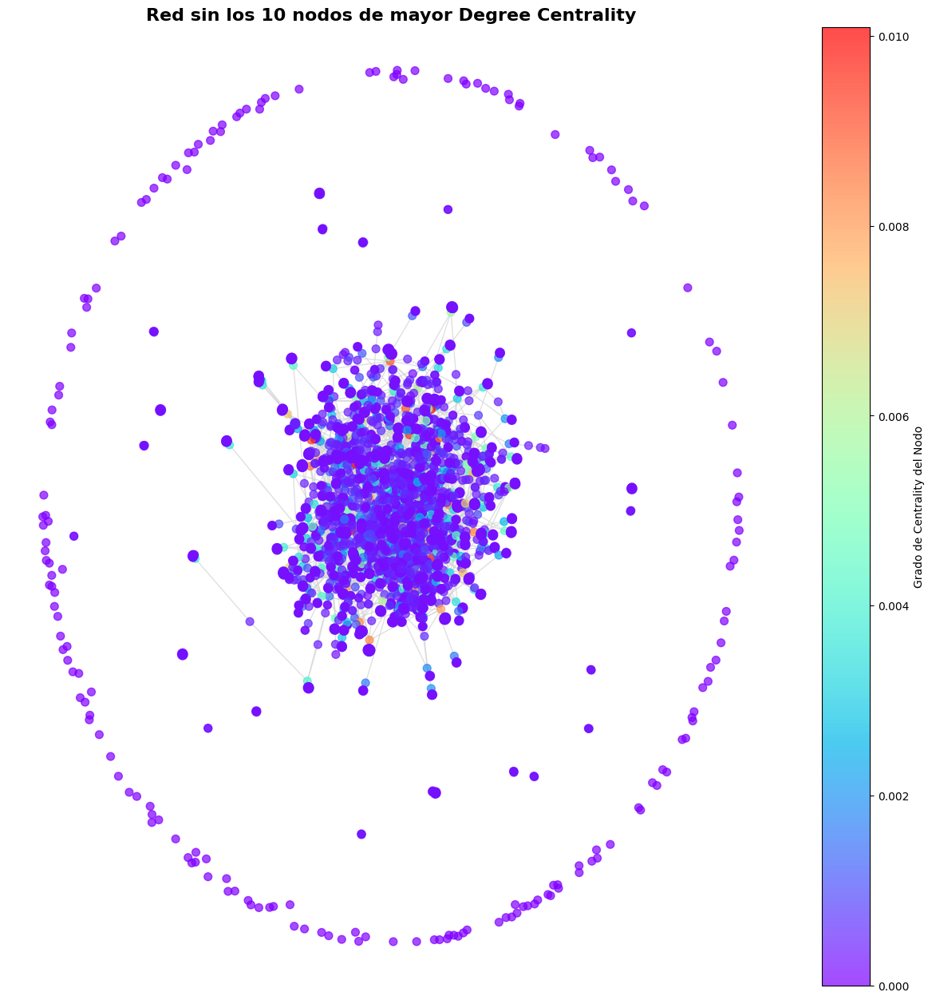

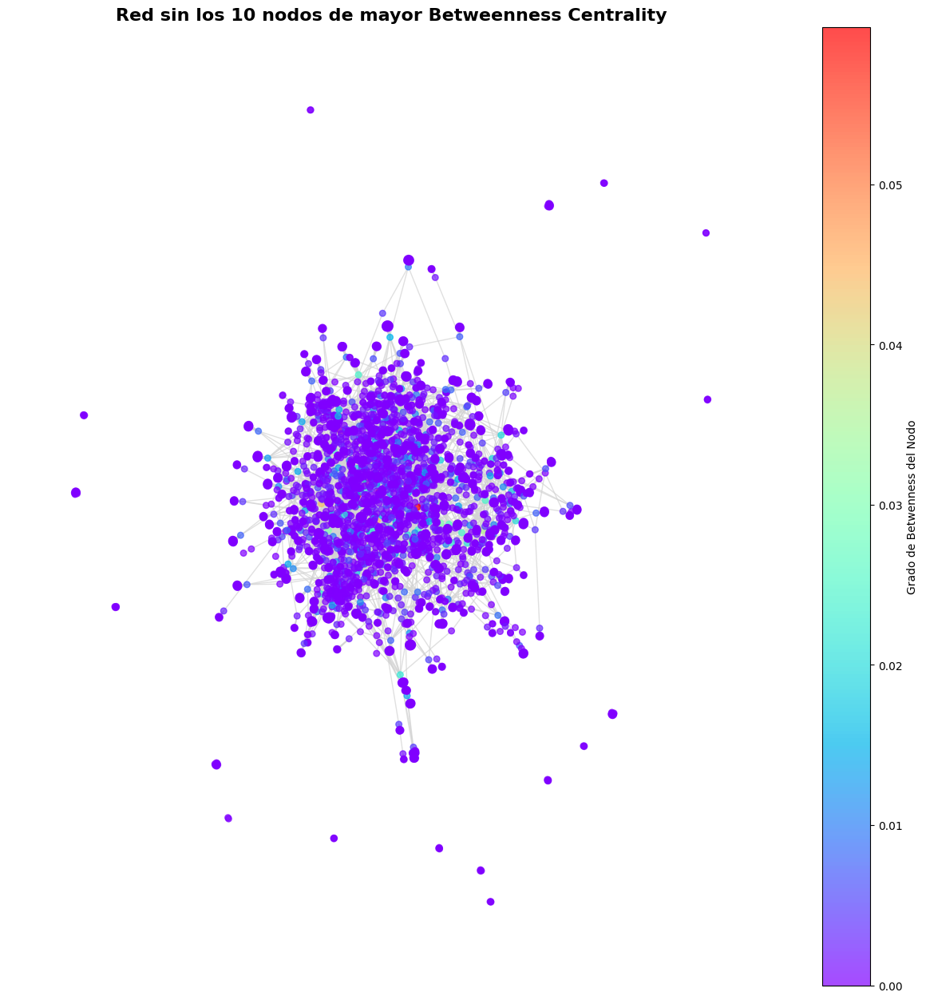

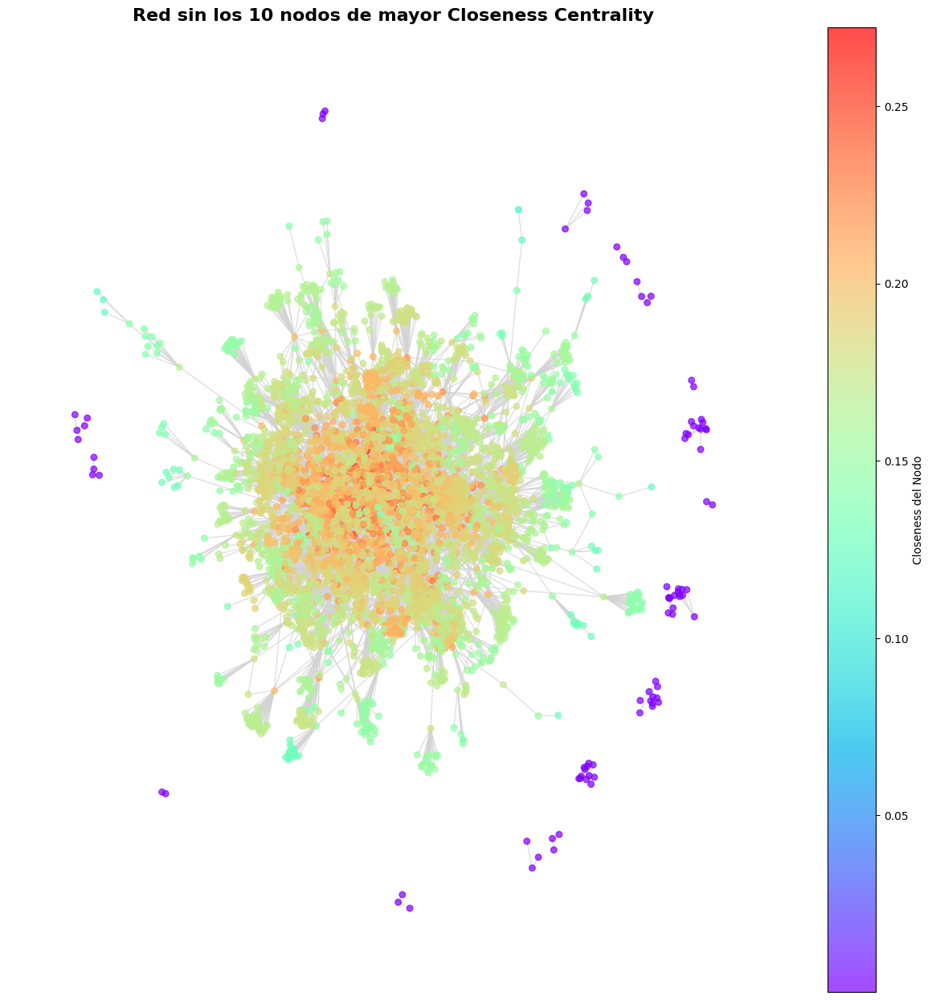

In [90]:
#hacer lo mismo con el red erdos

G_not_degree_erdos = G_erdos.copy()
G_not_degree_erdos.remove_nodes_from(sorted(degree_centrality_erdos, key=degree_centrality_erdos.get, reverse=True)[:10])
G_not_degree = G_not_degree_erdos.copy()

# Graficar con colores basados en degree centrality
plt.figure(figsize=(12, 12))
pos = nx.forceatlas2_layout(G_not_degree)
new_degree_centrality = nx.degree_centrality(G_not_degree)
node_colors = [new_degree_centrality[node] for node in G_not_degree.nodes()]
nx.draw(G_not_degree, pos, with_labels=False, node_size=50, node_color=node_colors, cmap=plt.cm.rainbow, alpha=0.7, edge_color='lightgray')
plt.colorbar(plt.gca().collections[0], label="Grado de Centrality del Nodo")
plt.title('Red sin los 10 nodos de mayor Degree Centrality', fontsize=16, fontweight='bold')
plt.show()

G_not_betweenness_erdos = G_erdos.copy()
G_not_betweenness_erdos.remove_nodes_from(sorted(betweenness_centrality, key=betweenness_centrality.get, reverse=True)[:10])
# Graficar con colores basados en betweenness centrality

G_not_betweenness = G_not_betweenness_erdos.copy()

plt.figure(figsize=(12, 12))
pos = nx.forceatlas2_layout(G_not_betweenness)
new_betwenness_centrality = nx.betweenness_centrality(G_not_betweenness)
node_colors = [new_betwenness_centrality[node] for node in G_not_betweenness.nodes()]
nx.draw(G_not_betweenness, pos, with_labels=False, node_size=30, node_color=node_colors, cmap=plt.cm.rainbow, alpha=0.7, edge_color='lightgray')
plt.colorbar(plt.gca().collections[0], label="Grado de Betwenness del Nodo")
plt.title('Red sin los 10 nodos de mayor Betweenness Centrality', fontsize=16, fontweight='bold')
plt.show()

G_not_betweenness_erdos = G_erdos.copy()
G_not_betweenness_erdos.remove_nodes_from(sorted(betweenness_centrality, key=betweenness_centrality.get, reverse=True)[:10])
# Graficar con colores basados en betweenness centrality

G_not_betweenness = G_not_betweenness_erdos.copy()


G_not_closeness_erdos = G_erdos.copy()
G_not_closeness_erdos.remove_nodes_from(sorted(closeness_centrality, key=closeness_centrality.get, reverse=True)[:10])
G_not_closeness = G_not_closeness_erdos.copy()
# Graficar con colores basados en closeness centrality
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G_not_closeness)
new_closeness_centrality = nx.closeness_centrality(G_not_closeness)
node_colors = [new_closeness_centrality[node] for node in G_not_closeness.nodes()]
nx.draw(G_not_closeness, pos, with_labels=False, node_size=30, node_color=node_colors, cmap=plt.cm.rainbow, alpha=0.7, edge_color='lightgray')
plt.colorbar(plt.gca().collections[0], label="Closeness del Nodo")
plt.title('Red sin los 10 nodos de mayor Closeness Centrality', fontsize=16, fontweight='bold')
plt.show()




Nuevas métricas después de remover nodos con mayor Degree Centrality:
Degree Centrality: {'contrib': 0.0002018978396931153, 'to': 0.0002018978396931153, '181': 0.0032303654350898446, '1': 0.004441752473248536, '295': 0.004441752473248536, '305': 0.0036341611144760752, '379': 0.007066424389259035, '406': 0.00343226327478296, '427': 0.006662628709872804, '664': 0.0002018978396931153, '1073': 0.0002018978396931153, '1548': 0.0004037956793862306, '1751': 0.0006056935190793458, '1988': 0.0002018978396931153, '2320': 0.0004037956793862306, '2786': 0.0008075913587724611, '3306': 0.0008075913587724611, '3965': 0.0004037956793862306, '4329': 0.0006056935190793458, '4864': 0.0002018978396931153, '5048': 0.0004037956793862306, '5195': 0.0010094891984655764, '5447': 0.0004037956793862306, '5581': 0.0002018978396931153, '5783': 0.0008075913587724611, '4065': 0.0002018978396931153, '2': 0.0036341611144760752, '4075': 0.0002018978396931153, '4209': 0.0002018978396931153, '4357': 0.0004037956793862306

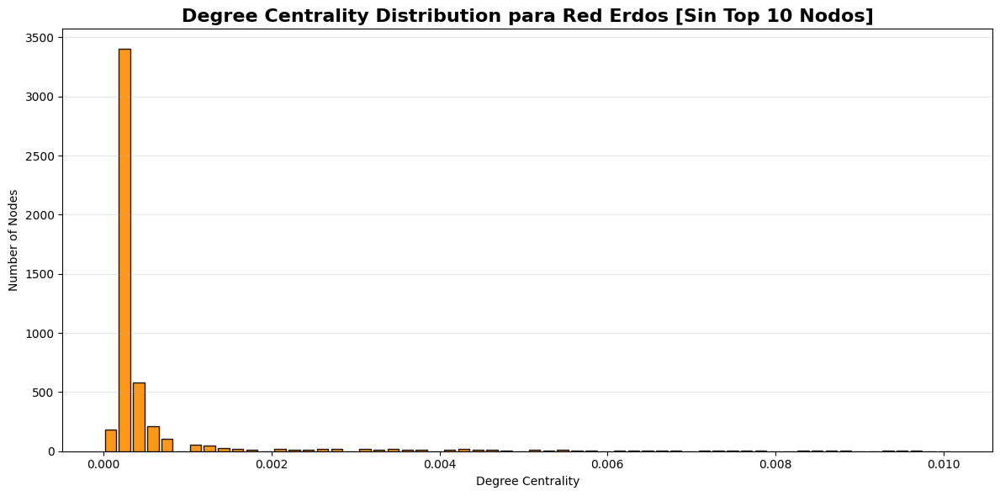


=== Closeness Centrality para red Erdos [Sin Top 10 Nodos]===
Valor máximo: 0.2722
Valor mínimo: 0.0002
Promedio: 0.1788
Desviación estándar: 0.0319
Top 3 nodos:
  1. Nodo 417: 0.2722
  2. Nodo 415: 0.2709
  3. Nodo 438: 0.2673


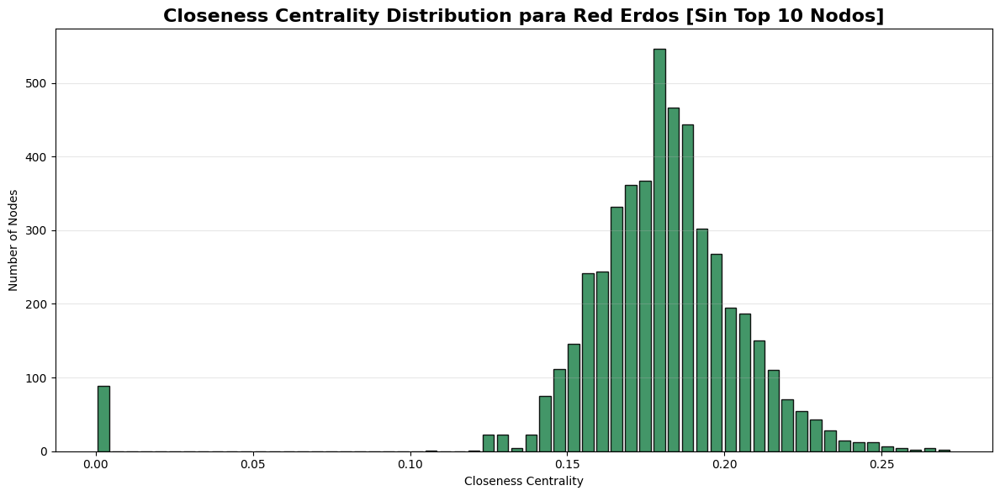


=== Betweenness Centrality para red Erdos [Sin Top 10 Nodos]===
Valor máximo: 0.0598
Valor mínimo: 0.0000
Promedio: 0.0009
Desviación estándar: 0.0036
Top 3 nodos:
  1. Nodo 175: 0.0598
  2. Nodo 417: 0.0573
  3. Nodo 415: 0.0569


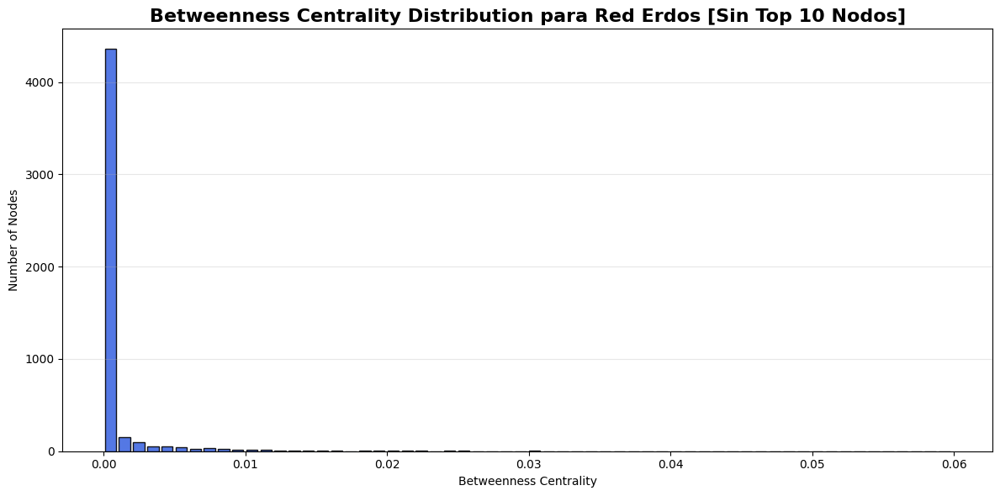

In [91]:
new_degree_centrality_erdos = nx.degree_centrality(G_not_degree_erdos)
new_closeness_centrality_erdos = nx.closeness_centrality(G_not_closeness_erdos)
new_betweenness_centrality_erdos = nx.betweenness_centrality(G_not_betweenness_erdos)
print("Nuevas métricas después de remover nodos con mayor Degree Centrality:")
print("Degree Centrality:", new_degree_centrality_erdos)
print("Closeness Centrality:", new_closeness_centrality_erdos)
print("Betweenness Centrality:", new_betweenness_centrality_erdos)

for i in [("Degree Centrality", new_degree_centrality_erdos), 
          ("Closeness Centrality", new_closeness_centrality_erdos), 
          ("Betweenness Centrality", new_betweenness_centrality_erdos)]:
    metric_name, centrality_dict = i
    print_centrality_stats(centrality_dict, metric_name, net_name='Erdos [Sin Top 10 Nodos]')
    
    # Crear gráficos
    plot_centrality(centrality_dict, type=metric_name.split()[0], net_name="Erdos [Sin Top 10 Nodos]")
 



En nuestra opinión, la robustez de una red depende de varios factores, pero la Erdos Renyi casi no cambia al quitar parámetros, si consideramos que se tiene que mantener la misma estructura, luego sería la Erdos Renyi la más robusta.

# Parte 2: Análisis de red social (20 puntos)

En esta segunda sección se debe trabajar con un grafo que refleja las interacciones de una red social.

El dataset es **lastfm_asia_edges.csv** y posee dos columnas: nodo origen y nodo destino.

## 2.1 Modelos de grafo (4 puntos)


Describa las principales características de los modelos:

* Erdös-Rényi
* Watts-Strogatz
* Barabási-Albert

¿En qué se diferencian?

**Respuesta:**

* El modelo Erdös Rényi consiste en una red creada prácticamente de forma binomial; cada par de nodos pueden (o pueden no) estar conectados con una probabilidad fija e inmutable en el tiempo. Por ende, forman pocos clusters y las muestras (nodos) tieneden a ser homogéneas en relaciones.
* El modelo Watts-Strogatz va variando las conexiones una vez ya establecidas, lo que genera una red más heterogénea y con mejor clustering, más similar a un grafo small world. Ya que cambian los enlaces entre los nodos sin modificar bruscamente la red, se pueden asimilar mejor a lo que ocurre en la vida real, sin la certeza de conexión que tiene Erdos Rényi.
* Barabási-Albert genera un modelo más realista de redes en escala, en la que "the rich get richer", o sea, que los hubs recibirán más gente antes de los nodos disgregados. Esto genera una red con nodos muy conectados y otros con pocas conexiones, lo que se asemeja más a las redes sociales reales.


## 2.2 Caracterización de la red (4 puntos)

Grafique la distribución de grado de la red y determine el grado promedio. Interprete sus resultados.

**Respuesta:**

In [ ]:
# importar csv

df_asia = pd.read_csv("lastfm_asia_edges.csv")
df_asia.head()

# crear grafo
G_asia = nx.from_pandas_edgelist(df_asia, 'node_1', 'node_2')
print(G_asia)



Graph with 7624 nodes and 27806 edges


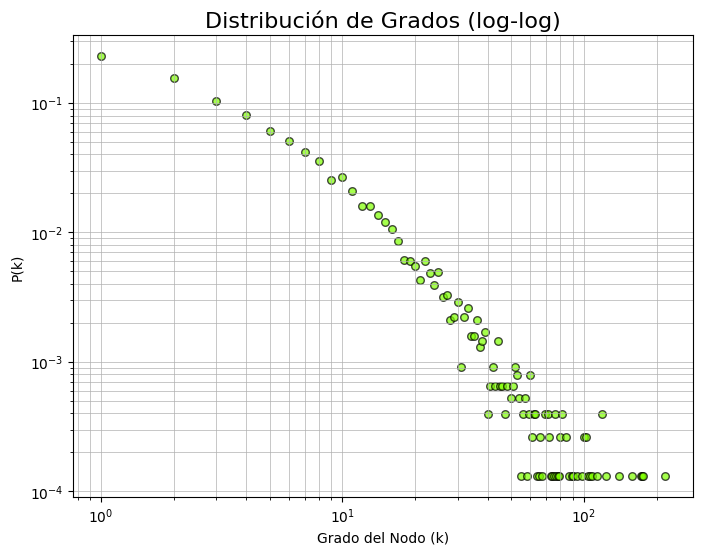

In [63]:
#distribucion del grado de la red

node_degrees = dict(G_asia.degree())
degrees = np.array(list(node_degrees.values()))
min_degree = degrees.min()
max_degree = degrees.max()

# normalizamos los grados
normalized_degrees = (degrees - min_degree) / (max_degree - min_degree)

unique_degrees, counts = np.unique(degrees, return_counts=True)
counts = counts/np.sum(counts)  # Normalizar los conteos

plt.figure(figsize=(8, 6))
plt.scatter(unique_degrees, counts, color="chartreuse", alpha=0.7, s=30, edgecolor="black")
plt.title("Distribución de Grados (log-log)", fontsize=16)
plt.xlabel("Grado del Nodo (k)")
plt.ylabel("P(k)")
plt.xscale("log")
plt.yscale("log")
plt.grid(True, which="both", linewidth=0.5)
plt.show()





## 2.3 Detección de HUB (4 puntos)

Determine la existencia de HUB en la red, indicando los nodos. Justifique el criterio utilizado.

Luego, realice un gráfico apropiado que permita visualizarlos en la red (modificar tamaño o color).

**Respuesta:**

In [67]:
#determinar existencia del hub en la red, indicando los nodos

degrees = np.array(list(node_degrees.values()))
threshold = np.percentile(degrees, 90)  # top 10% nodos más conectados

hubs = [node for node, deg in node_degrees.items() if deg >= threshold]
#print("Nodos hubs:", hubs)

pos = nx.forceatlas2_layout(G_asia, seed=42)

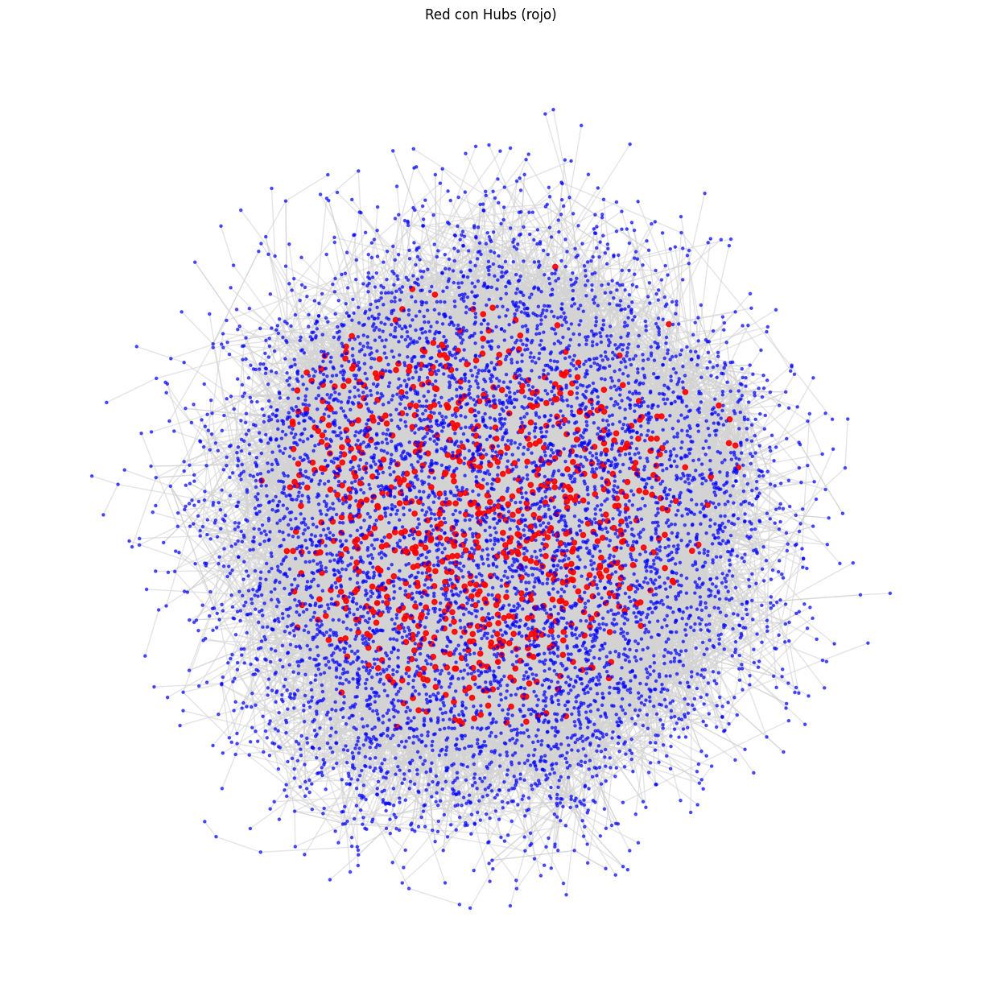

In [72]:
# Colorear hubs en rojo, otros en azul
node_colors = ['red' if node in hubs else 'blue' for node in G_asia.nodes()]
node_sizes = [20 if node in hubs else 5 for node in G_asia.nodes()]
node_alphas = [0.9 if node in hubs else 0.6 for node in G_asia.nodes()]

figure = plt.figure(figsize=(12, 12))
nx.draw(G_asia, pos, node_color=node_colors, with_labels=False, node_size=node_sizes, alpha=node_alphas, edge_color='lightgray')
plt.title("Red con Hubs (rojo)")
plt.show()

## 2.4 Scale-Free (4 puntos)

Calcule el coeficiente **gamma (γ)**, ajustando una power-law. Obtenga el coeficiente de determinación. ¿Qué tan bueno es el ajuste?

¿La red es scale-free? Justifique su respuesta.

**Respuesta:**

In [93]:
from scipy import stats

x = unique_degrees
p = counts

log_k = np.log(range(1, len(x) + 1))
log_pk = np.log(p)

slope, intercept, r_value, p_value, std_err = stats.linregress(log_k, log_pk)

gamma = -slope
print(f'El exponente de la ley de potencias (γ) es aproximadamente: {gamma:.4f}')



El exponente de la ley de potencias (γ) es aproximadamente: 2.0852


Que el gamma sea de 2.0852 significa que tiene una distribución Scale Free, con pocos hubs que centran muchas relaciones y muchísimos nodos menos significantes.

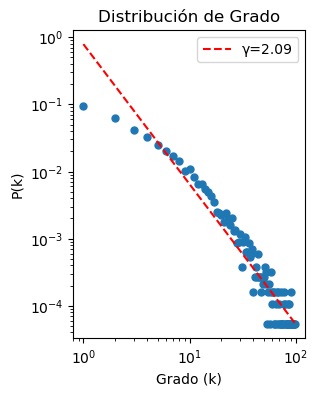

In [ ]:
# Graficar la distribución de grado en una escala log-log
plt.figure(figsize=(3, 4))
plt.loglog(range(1, len(x) + 1), p, 'o', markersize=5)
plt.xlabel('Grado (k)')
plt.ylabel('P(k)')
plt.title('Distribución de Grado')

# Graficar la línea ajustada
plt.plot(np.exp(log_k), np.exp(intercept + slope * log_k), color='red', linestyle='--', label=f'γ={gamma:.2f}')
plt.legend()
plt.show()

In [ ]:
# Coeficiente de determinación (R²), si es cercano a 1 tenemos un buen ajuste
r_squared = r_value**2
print(f"R²: {r_squared}")

R²: 0.9301423402898731


In [ ]:
# p-value bajo (p-value < 0.05) sugiere una relación estadísticamente significativa
print(f"P-value: {p_value}")

P-value: 2.801174242798798e-57


El R² es grande y el valor P es pequeño por lo que podemos considerar que la red es Scale Free.

## 2.5 Comparación de redes (4 puntos)

Utilizando las principales características de la red social analizada, cree dos grafos basados en los modelos Erdös-Rényi y Barabási-Albert.

* Para Erdös-Rényi: evalúe **p** en el intervalo 0 a p=0.001, seleccionando la probabilidad de tal manera que el grado promedio del grafo se aproxime al de la red social real.

* Para Barabási–Albert: evalúe **m** entre 1 y 20. Seleccione este parámetro de tal manera que el grado promedio del grafo creado se aproxime al de red social real.

Luego, en un mismo gráfico, muestre la distribución de grado de los tres grafos: red social real, Erdös-Rényi y Barabási–Albert. ¿Qué tipo de modelo de grafo se ajusta mejor al comportamiento de la red social? Justique.

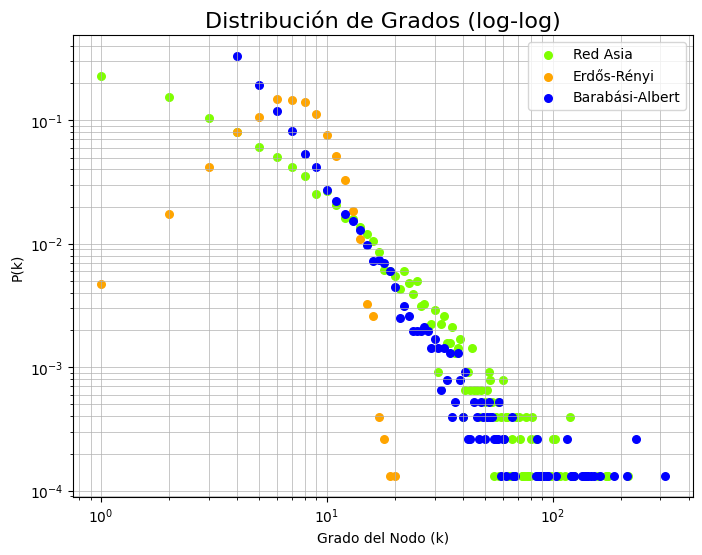

In [103]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

G_asia_copy = G_asia.copy()

num_nodes = G_asia_copy.number_of_nodes()
average_degree = sum(dict(G_asia_copy.degree()).values()) / num_nodes

p = average_degree / (num_nodes - 1)
G_erdos = nx.erdos_renyi_graph(num_nodes, p)

m = max(1, int(round(average_degree / 2)))
G_ba = nx.barabasi_albert_graph(num_nodes, m)

def degree_distribution(G):
    degrees = np.array(list(dict(G.degree()).values()))
    unique_degrees, counts = np.unique(degrees, return_counts=True)
    counts = counts / np.sum(counts)  # normalize to probability
    return unique_degrees, counts

unique_asia, counts_asia = degree_distribution(G_asia_copy)
unique_erdos, counts_erdos = degree_distribution(G_erdos)
unique_ba, counts_ba = degree_distribution(G_ba)

# --- Plotting ---
plt.figure(figsize=(8, 6))
plt.scatter(unique_asia, counts_asia, color="chartreuse", alpha=1, s=30, label="Red Asia")
plt.scatter(unique_erdos, counts_erdos, color="orange", alpha=1, s=30, label="Erdős-Rényi")
plt.scatter(unique_ba, counts_ba, color="blue", alpha=1, s=30, label="Barabási-Albert")

plt.title("Distribución de Grados (log-log)", fontsize=16)
plt.xlabel("Grado del Nodo (k)")
plt.ylabel("P(k)")
plt.xscale("log")
plt.yscale("log")
plt.grid(True, which="both", linewidth=0.5)
plt.legend()
plt.show()



**Respuesta:**

Es muy claro que 

# Parte 3: Detección de comunidades (20 puntos)

En esta sección investigaremos e implementaremos métodos de detección de comunidades. Esta tarea resulta fundamental, ya que permite comprender cómo se organizan los nodos de un grafo en grupos con alta cohesión interna

## 3.1 Definiciones (2.5 Puntos)

Investigue y defina los siguientes conceptos relacionados con detección de comunidades en grafos:

* **Modularidad:** cuando una red se modulariza, significa que presenta comunidades compactas con muchas conexiones entre sí, pero pocas conexiones desde la comunidad hacia afuera. Por ejemplo, las comunidades en la universidad pueden ser muy modularizadas (por ejemplo, círculos académicos, laboratorios, en general grupos especializados) o poco modularizadas (grupos de clases, deportes, donde mucha gente comparte con muchas otras personas). Hay algunas fórmulas para la modularidad que se pondrán en el código de la pregunta. De [Wikipedia](https://en.wikipedia.org/wiki/Modularity_(networks)).

* **Algoritmo de Louvain:** el algoritmo de Louvain (llamado así por donde sus creadores estudiaban, *Université Catholiqué de Louvain*) busca extraer comunidades de forma veloz desde redes grandes, optimizando la **modularidad** a medida que aumenta la progresión del algoritmo, así pudiendo llegar a un máximo de *clusters* o grupos bien definidos. El Algoritmo funciona de la siguiente forma:
1. A cada nodo se le define su propia comunidad (Nodos = Comunidades)
2. Para cada nodo, evaluamos la modularidad al cambiarlo a una comunidad adyacente. Se repite con todos los nodos hasta que la modularidad deje de aumentar.
3. Agregación de los clusters en su propio supernodo.

Algunos problemas del Algoritmo de Louvain son la restricción de que un nodo sólo puede pertenecer a una comunidad. Además, hay un límite en la resolución, lo que significa que es probable que tenga grupos pequeños (comunidades pequeñas) absorbidas o presentadas en grupos (comunidades) más grandes. Por ende se pierde información sobre *clusters* pequeños que podrían tener un valor informativo en una red. De [Wikipedia](https://en.wikipedia.org/wiki/Louvain_method).

* **Algoritmo de Leiden:** el algoritmo de Leiden es un algoritmo realizado a partir del algoritmo de Louvain pero con una etapa intermedia que garantiza que las subcomunidades generadas son óptimas dentro de cada comunidad, y garantiza un posicionamiento de forma que, a pesar de que se mejore la modularidad, no se disgreguen comunidades pequeñas, que era un problema en Louvain.

1. Cada nodo comienza en su propia comunidad, igual que Louvain.
2. Movemos nodos hasta maximizar la modularidad. Pero antes de crear el supernodo, se identifican las sub-comunidades que crearían el nuevo supernodo. Se evalúa si esas sub-comunidades quedarían mejor en otro lugar en el grafo. La diferencia clave es no mover sólo los nodos, sino también las sub-comunidades.
3. Agregación de los clusters en el supernodo identificado y repetir el proceso.


* **Normalized Mutual Information (NMI):** la Información Mutua Normalizada es un concepto que proviene de la teoría de información. Es la respuesta a la pregunta ¿qué información me proveerá el evento A si ya conozco el evento B? En teoría de grafos la NMI se calcula por ejemplo para comparar la similitud de información contenida en distintos grafos. De [Nature](https://www.nature.com/articles/s42005-024-01830-3#Equ10) (se utilizará la definición pesentada aquí y en Scikit).

* **Adjusted Rand Index (ARI):** el Rand Index nos dice qué tanto "agreement" hay en que elementos de un conjunto se clusterizen. Este se puede ajustar para que un cluster unánime tenga puntaje 1, un cluster aleatorio tiene puntaje 0, y un cluster peor que aleatorio tiene puntaje negativo. De [Geek for Geeks](https://www.geeksforgeeks.org/machine-learning/rand-index-in-machine-learning/)

**Rsspuesta:**

## 3.2 Modelo LFR (2.5 Puntos)

Cree un grafo usando el modelo Lancichinetti-Fortunato-Radicchi con los siguientes hiperparámetros:

* n = 300
* tau1 = 3
* tau2 = 1.5
* mu = 0.2
* average_degree = 7
* min_community = 20
* seed = 10

¿Cuántas nodos, aristas y comunidades tiene el grafo?

**Respuesta:**

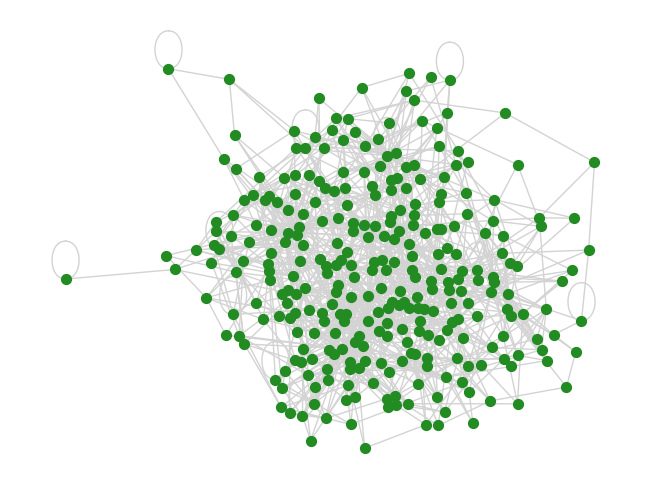

In [ ]:
# Hagamos un grafo usando LFR, en networkx está bien descrito el benchmark: https://networkx.org/documentation/stable/reference/generated/networkx.generators.community.LFR_benchmark_graph.html
G_lfr = nx.LFR_benchmark_graph(300, tau1=3, tau2=1.5, mu=0.2, average_degree=7, min_community=20, seed=10)
nx.draw(G_lfr, node_size=50, edge_color='lightgray', node_color='forestgreen')

## 3.3 Implementación de algoritmos (5 Puntos)

Aplique los algoritmos de Louvain y Leiden al grafo obtenido en la sección anterior, y obtenga la partición de comunidades resultante de cada algoritmo.

*Nota:* Puede usar librerias externas que ya implementen estos algoritmos.

**Respuesta:**

In [ ]:
#!pip install leidenalg

G_louvain = G_lfr.copy()
G_leiden = G_lfr.copy()

In [ ]:
import igraph as ig
import leidenalg as la

partition_louvain = nx.community.louvain_communities(G_louvain)
print(partition_louvain)

edges = list(G_leiden.edges())
G_ig = ig.Graph(edges=edges, directed=False)
G_ig.vs["name"] = list(G_leiden.nodes())
partition_leiden = la.find_partition(G_ig, la.ModularityVertexPartition)
print(partition_leiden)

[{256, 130, 3, 4, 133, 5, 141, 16, 272, 34, 39, 169, 298, 299, 171, 46, 177, 179, 181, 56, 57, 58, 185, 60, 186, 75, 79, 209, 212, 218, 223, 227, 106, 113, 249, 251, 124}, {268, 270, 273, 145, 148, 278, 151, 152, 23, 25, 284, 285, 288, 33, 35, 164, 293, 295, 42, 176, 180, 54, 184, 187, 206, 81, 214, 87, 215, 119, 224, 102, 111, 114, 247, 248}, {261, 69, 264, 267, 143, 21, 28, 221, 96, 98, 38, 230, 40, 43, 107, 112, 49, 50, 116, 245, 118, 246, 253}, {64, 65, 195, 68, 259, 70, 7, 6, 73, 74, 139, 207, 18, 274, 20, 276, 275, 213, 89, 220, 29, 31, 225, 37, 104, 235, 44, 238, 241, 55}, {129, 258, 131, 260, 263, 8, 265, 10, 266, 140, 269, 13, 150, 280, 155, 157, 158, 161, 291, 165, 166, 167, 294, 45, 175, 47, 51, 189, 193, 194, 196, 204, 76, 208, 93, 226, 232, 110}, {192, 66, 71, 138, 203, 14, 142, 146, 147, 211, 84, 283, 92, 159, 289, 162, 170, 236, 237, 244, 183, 125, 62}, {0, 128, 2, 136, 22, 279, 281, 153, 26, 156, 27, 30, 286, 32, 290, 36, 168, 296, 172, 174, 48, 178, 53, 59, 61, 191, 67

## 3.4 Medición de la calidad de las comunidades (5 Puntos)

Calcule las métricas NMI y ARI para las particiones obtenidas por cada algoritmo. Comente sus resultados.

**Respuesta:**

In [ ]:
nodes = sorted(G_louvain.nodes())
labels_nx = [None] * len(nodes)
for community_idx, community in enumerate(partition_louvain):
    for node in community:
        labels_nx[node] = community_idx
labels_ig = partition_leiden.membership

from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score

nmi = normalized_mutual_info_score(labels_nx, labels_ig)
ari = adjusted_rand_score(labels_nx, labels_ig)

print("NMI:", nmi)
print("ARI:", ari)

NMI: 0.8736247546048417
ARI: 0.834256046725748


## 3.5 Detección y representación de comunidades (5 Puntos)

Ejecute los algoritmos sobre alguno de los grafos de las secciones anteriores. Grafique el grafo coloreando los nodos según la partición obtenida y comente.

**Respuesta:**

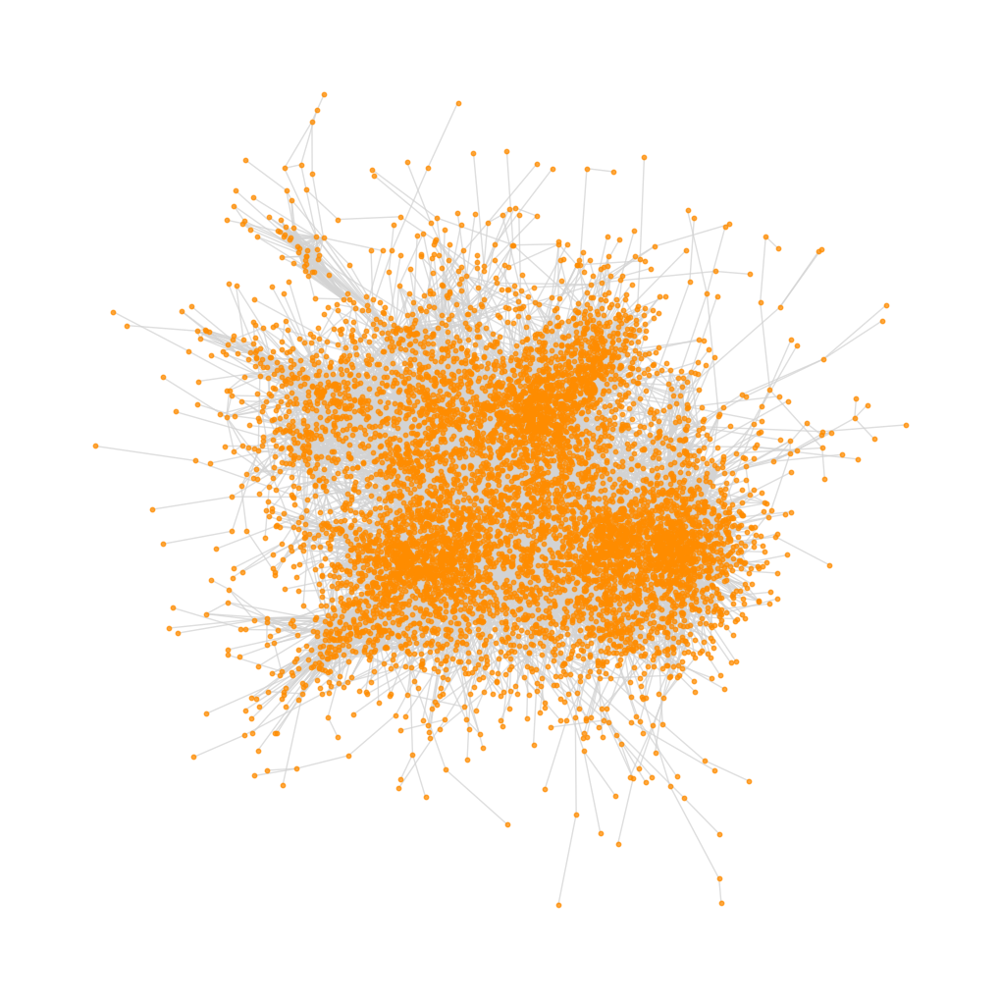

In [73]:
fig = plt.figure(figsize=(10, 10))
nx.draw(G_asia, node_size=10, node_color = 'darkorange', edge_color='lightgray', alpha = 0.75) # :3



In [ ]:
G_asia_louvain = G_asia.copy()
G_asia_leiden = G_asia.copy()

asia_partition_louvain = nx.community.louvain_communities(G_louvain)
print(asia_partition_louvain)

edges = list(G_asia_leiden.edges())
G_asia_leiden = ig.Graph(edges=edges, directed=False)
G_asia_leiden.vs["name"] = list(G_leiden.nodes())
asia_partition_leiden = la.find_partition(G_asia_leiden, la.ModularityVertexPartition)
print(asia_partition_leiden)

[{1, 132, 134, 199, 72, 137, 202, 11, 15, 83, 88, 217, 91, 100, 229, 228, 101, 231, 52, 117, 120, 126, 188, 254, 63}, {270, 273, 148, 278, 151, 152, 23, 25, 284, 285, 288, 33, 35, 164, 293, 294, 295, 42, 176, 180, 184, 206, 81, 214, 215, 87, 119, 224, 102, 111, 114, 247, 248}, {261, 69, 264, 267, 143, 21, 28, 221, 96, 98, 38, 230, 40, 43, 107, 112, 49, 50, 116, 245, 118, 246, 253}, {64, 65, 259, 68, 195, 70, 7, 6, 73, 74, 139, 207, 18, 275, 20, 213, 274, 276, 89, 220, 29, 31, 225, 37, 104, 235, 44, 238, 241, 55}, {192, 66, 71, 138, 203, 14, 142, 146, 147, 84, 211, 283, 92, 159, 289, 162, 170, 236, 237, 244, 183, 125, 62}, {129, 258, 131, 260, 263, 8, 266, 10, 140, 269, 268, 13, 150, 280, 155, 27, 157, 158, 161, 291, 165, 166, 167, 39, 45, 175, 47, 51, 187, 189, 194, 67, 196, 204, 76, 208, 93, 226, 232, 110, 113}, {256, 130, 3, 4, 133, 5, 141, 16, 272, 145, 34, 169, 298, 171, 299, 46, 179, 181, 54, 56, 185, 57, 186, 75, 79, 209, 212, 218, 223, 227, 106, 249, 251, 124}, {198, 135, 9, 201

[{3841, 3850, 5643, 5390, 6929, 3091, 2580, 1301, 282, 4635, 5148, 2587, 1307, 2334, 1313, 1826, 298, 4395, 1583, 1586, 4658, 2357, 4156, 1089, 2113, 327, 6730, 4172, 1102, 6990, 5456, 849, 85, 7509, 4695, 6743, 1113, 3413, 4441, 7260, 4196, 2917, 2410, 3435, 4972, 5998, 7024, 881, 3444, 3962, 5757, 387, 6533, 902, 1931, 6796, 654, 5262, 7567, 3473, 2449, 3221, 2709, 7324, 6813, 3488, 7584, 419, 7080, 6827, 5292, 1453, 5810, 7605, 4534, 7095, 3001, 5818, 4282, 4798, 7359, 4286, 1729, 6078, 4547, 5574, 2505, 969, 7114, 7115, 3792, 4817, 5329, 1488, 2520, 4570, 2270, 7137, 4834, 3303, 4327, 748, 4589, 4078, 3054, 3571}, {6152, 13, 6161, 2071, 7192, 5145, 3101, 2085, 4134, 7208, 41, 6184, 3118, 5169, 5172, 5174, 2102, 1081, 7239, 6215, 1097, 6217, 77, 2130, 83, 4180, 7257, 4195, 4197, 6249, 2154, 4203, 110, 115, 1149, 1151, 1154, 6274, 1156, 4230, 3209, 3213, 6287, 6290, 7315, 2199, 7319, 152, 6298, 151, 1186, 1194, 6321, 3257, 7354, 7360, 4293, 1223, 7371, 7382, 2265, 2266, 2267, 4315, 6

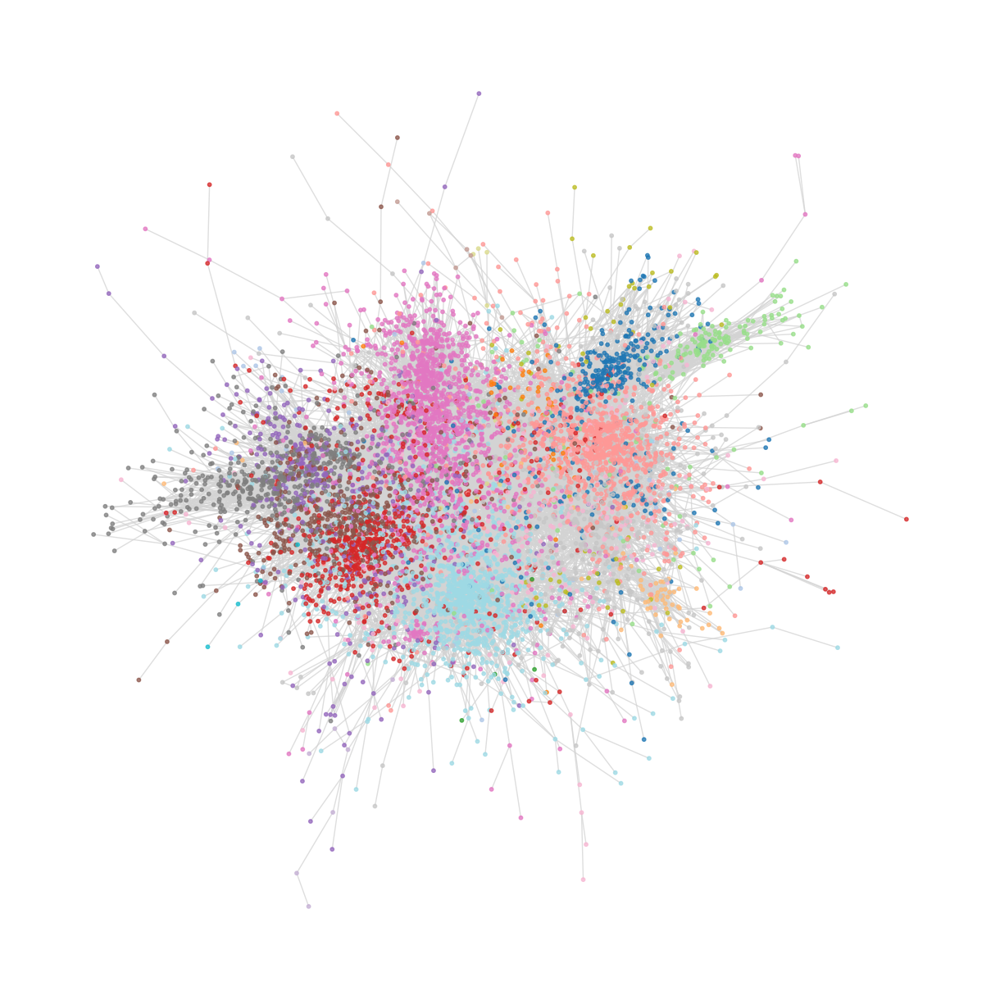

In [ ]:
G_asia_louvain = G_asia.copy()
G_asia_leiden = G_asia.copy()

asia_partition_louvain = nx.community.louvain_communities(G_asia_louvain)
print(asia_partition_louvain)

edges = list(G_asia_leiden.edges())
G_asia_leiden = ig.Graph(edges=edges, directed=False)
G_asia_leiden.vs["name"] = list(G_leiden.nodes())
asia_partition_leiden = la.find_partition(G_asia_leiden, la.ModularityVertexPartition)
print(asia_partition_leiden)

nodes = sorted(G_asia_louvain.nodes())
labels_asia_nx = [None] * len(nodes)
for community_idx, community in enumerate(asia_partition_louvain):
    for node in community:
        labels_asia_nx[node] = community_idx
labels_asia_ig = asia_partition_leiden.membership

nodes = sorted(G_asia.nodes())

fig = plt.figure(figsize=(12, 12))
nx.draw(G_asia, nodelist=nodes, node_color=labels_asia_nx, node_size=10, alpha=0.75, edge_color='lightgray', cmap=plt.cm.tab20)
fig.title("Algoritmo Leiden")
plt.show()

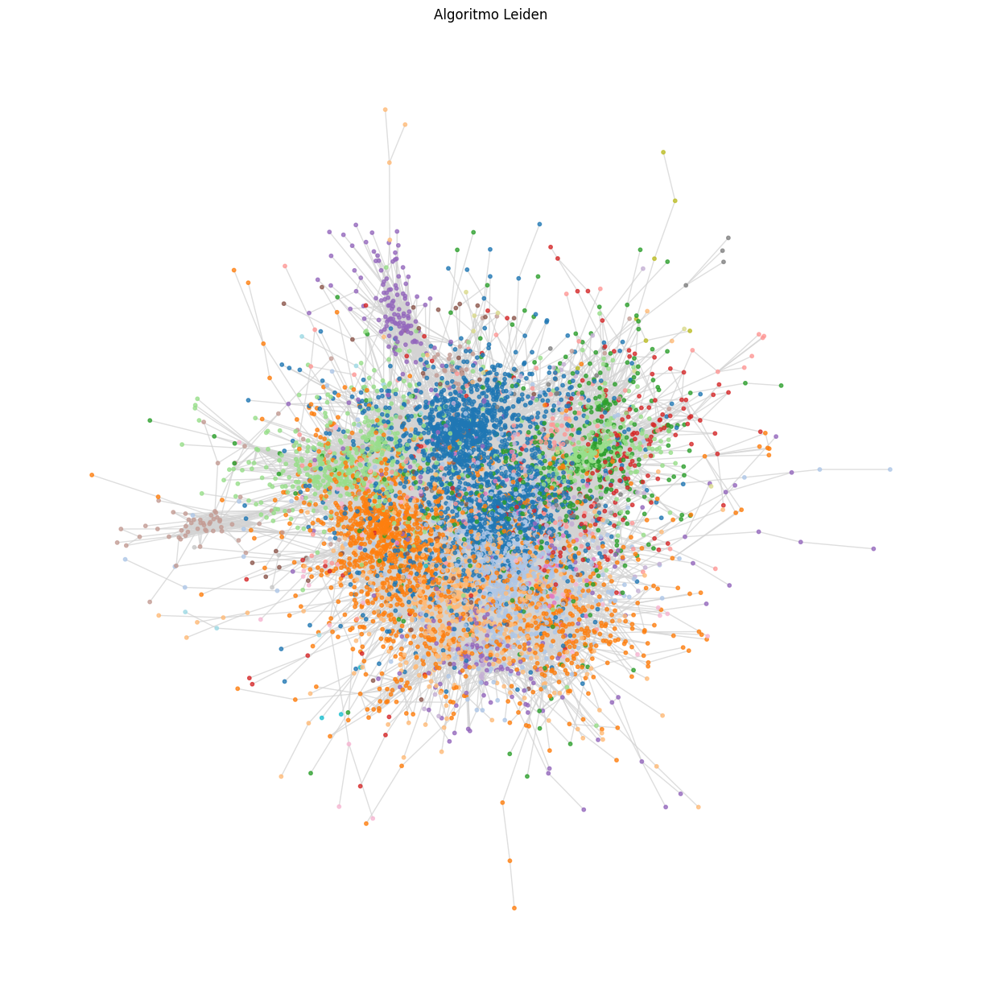

In [ ]:

ig_nodes = G_asia_leiden.vs["name"]

ig_index_to_node = {i: name for i, name in enumerate(ig_nodes)}

edges = list(G_asia.edges())
G_asia_leiden = ig.Graph.TupleList(edges, directed=False)
asia_partition_leiden = la.find_partition(G_asia_leiden, la.ModularityVertexPartition)

ig_nodes = G_asia_leiden.vs["name"]
node_to_ig_idx = {name: i for i, name in enumerate(ig_nodes)}
labels_asia_ig = [asia_partition_leiden.membership[node_to_ig_idx[node]] for node in nodes]

fig = plt.figure(figsize=(12, 12))
nx.draw(G_asia, nodelist=nodes, node_color=labels_asia_ig, node_size=10, alpha=0.75, edge_color="lightgray", cmap=plt.cm.tab20)
plt.title("Algoritmo Leiden")

plt.show()
